In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

# 확인된 정확한 폴더 경로
target_path = '/content/drive/MyDrive/3.개방데이터'

def print_drive_summary(startpath, max_depth=3):
    print(f"📂 탐색 중인 경로: {startpath}")
    print("=" * 50)

    for root, dirs, files in os.walk(startpath):
        # 현재 경로의 깊이 계산
        depth = root.replace(startpath, '').count(os.sep)

        # 설정한 깊이보다 깊어지면 중단
        if depth > max_depth:
            continue

        # 트리 모양 생성
        indent = '│   ' * depth
        folder_name = os.path.basename(root)

        # 현재 폴더의 파일 확장자 요약
        ext_counts = {}
        for f in files:
            ext = os.path.splitext(f)[1].lower()
            if ext:
                ext_counts[ext] = ext_counts.get(ext, 0) + 1

        summary = ", ".join([f"{ex} {cnt}개" for ex, cnt in ext_counts.items()])
        if summary:
            summary = f" ⮕ ({summary})"

        print(f"{indent}├── [Folder] {folder_name}{summary}")

if os.path.exists(target_path):
    print_drive_summary(target_path)
else:
    print(f"❌ '{target_path}' 경로를 찾을 수 없습니다. 마운트 상태를 확인해주세요.")

📂 탐색 중인 경로: /content/drive/MyDrive/3.개방데이터
├── [Folder] 3.개방데이터
│   ├── [Folder] 1.데이터
│   │   ├── [Folder] Validation
│   │   │   ├── [Folder] 01.원천데이터 ⮕ (.zip 1개)
│   │   │   ├── [Folder] 02.라벨링데이터 ⮕ (.irx264 1개, .zip 1개)


In [ ]:
import os

# 1. 경로 설정
zip_image_path = "/content/drive/MyDrive/3.개방데이터/1.데이터/Validation/01.원천데이터/*.zip"
zip_label_path = "/content/drive/MyDrive/3.개방데이터/1.데이터/Validation/02.라벨링데이터/*.zip"

# 2. 압축을 풀 로컬 폴더 생성
os.makedirs("/content/val_images", exist_ok=True)
os.makedirs("/content/val_labels", exist_ok=True)

# 3. 원천데이터(이미지) 압축 풀기
print("이미지 압축 푸는 중...")
!unzip -q {zip_image_path} -d /content/val_images

# 4. 라벨링데이터(JSON/XML) 압축 풀기
print("라벨링 데이터 압축 푸는 중...")
!unzip -q {zip_label_path} -d /content/val_labels

print("✅ 모든 압축 해제 완료!")

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
✅ 모든 압축 해제 완료!


In [ ]:
import os
import glob
import shutil
from sklearn.model_selection import train_test_split

# 1. 기존 폴더명 변경 (사용자 요청)
if os.path.exists('/content/val_images'):
    os.rename('/content/val_images', '/content/images')
if os.path.exists('/content/val_labels'):
    os.rename('/content/val_labels', '/content/labels')
print("✅ 1단계: 폴더명 변경 완료 (/content/images, /content/labels)")

# 2. 경로 설정 및 분할 준비
image_dir = '/content/images'
label_dir = '/content/labels'
split_base = '/content/split_dataset'
backup_path = '/content/drive/MyDrive/Battery_Project_Backup'

# 분할된 데이터를 저장할 폴더 구조 생성
for split in ['train', 'val']:
    os.makedirs(os.path.join(split_base, split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(split_base, split, 'labels'), exist_ok=True)

# 3. 데이터 리스트 확보 및 분할 (8:2 비율)
images = sorted(glob.glob(os.path.join(image_dir, '*')))
# 확장자를 제외한 파일명만 추출하여 라벨과 매칭 확인
train_imgs, val_imgs = train_test_split(images, test_size=0.2, random_state=42)

def move_files(file_list, target_split):
    for img_path in file_list:
        file_name = os.path.basename(img_path)
        base_name = os.path.splitext(file_name)[0]

        # 이미지 이동
        shutil.move(img_path, os.path.join(split_base, target_split, 'images', file_name))

        # 라벨 이동 (라벨 확장자가 .json이라고 가정, 다를 경우 수정 가능)
        # 모든 확장자의 라벨을 찾으려면 glob 사용
        label_pattern = os.path.join(label_dir, base_name + ".*")
        for lbl_path in glob.glob(label_pattern):
            shutil.move(lbl_path, os.path.join(split_base, target_split, 'labels', os.path.basename(lbl_path)))

print("📂 2단계: 데이터 분할 및 이동 중...")
move_files(train_imgs, 'train')
move_files(val_imgs, 'val')

# 4. 각각 압축 및 구글 드라이브 백업
os.makedirs(backup_path, exist_ok=True)

def compress_and_save(target_name):
    source_dir = os.path.join(split_base, target_name)
    zip_name = f"{target_name}_dataset"

    print(f"📦 {target_name} 데이터 압축 중...")
    shutil.make_archive(f"/content/{zip_name}", 'zip', source_dir)

    print(f"🚀 {zip_name}.zip 드라이브로 백업 중...")
    shutil.copy(f"/content/{zip_name}.zip", os.path.join(backup_path, f"{zip_name}.zip"))

compress_and_save('train')
compress_and_save('val')

print(f"\n✨ 모든 작업 완료!")
print(f"📍 백업 위치: {backup_path}")
print(f"📍 분할 개수: Train {len(train_imgs)}개, Val {len(val_imgs)}개")

✅ 1단계: 폴더명 변경 완료 (/content/images, /content/labels)
📂 2단계: 데이터 분할 및 이동 중...
📦 train 데이터 압축 중...
🚀 train_dataset.zip 드라이브로 백업 중...
📦 val 데이터 압축 중...
🚀 val_dataset.zip 드라이브로 백업 중...

✨ 모든 작업 완료!
📍 백업 위치: /content/drive/MyDrive/Battery_Project_Backup
📍 분할 개수: Train 17797개, Val 4450개


In [ ]:
# 2. 드라이브에 있는 파일을 코랩 로컬(/content)로 바로 해제
!unzip -q "/content/drive/MyDrive/Battery_Project_Backup/train_dataset.zip" -d "/content/split_dataset/train"
!unzip -q "/content/drive/MyDrive/Battery_Project_Backup/val_dataset.zip" -d "/content/split_dataset/val"

print("✅ 해제 완료!")

checkdir:  cannot create extraction directory: /content/split_dataset/train
           No such file or directory
checkdir:  cannot create extraction directory: /content/split_dataset/val
           No such file or directory
✅ 해제 완료!


In [ ]:
import zipfile
import os

def safe_unzip(zip_path, extract_path):
    if os.path.exists(zip_path):
        os.makedirs(extract_path, exist_ok=True)
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(extract_path)
        print(f"✅ {os.path.basename(zip_path)} 해제 완료!")
    else:
        print(f"❌ 파일을 찾을 수 없습니다: {zip_path}")

# 실행
safe_unzip("/content/drive/MyDrive/Battery_Project_Backup/train_dataset.zip", "/content/split_dataset/train")
safe_unzip("/content/drive/MyDrive/Battery_Project_Backup/val_dataset.zip", "/content/split_dataset/val")

✅ train_dataset.zip 해제 완료!
✅ val_dataset.zip 해제 완료!


DATASET 이미지 개수 확인

In [ ]:
import json
import os
import glob
from pprint import pprint

def inspect_json_structure(json_dir):
    # 1. 폴더 내 첫 번째 JSON 파일 찾기
    json_files = glob.glob(os.path.join(json_dir, "*.json"))

    if not json_files:
        print("❌ 해당 경로에 JSON 파일이 없습니다.")
        return

    sample_path = json_files[0]
    print(f"📂 분석 파일: {os.path.basename(sample_path)}")
    print("=" * 50)

    # 2. JSON 로드
    with open(sample_path, 'r', encoding='utf-8') as f:
        data = json.load(f)

    # 3. 최상위 키(Top-level Keys) 확인
    print(f"✅ 최상위 구조(Keys): {list(data.keys())}")
    print("-" * 50)

    # 4. 주요 데이터 샘플 출력 (내용이 너무 길 수 있으므로 pprint 사용)
    print("📝 데이터 샘플 (첫 1~2개 항목):")
    # 전체를 다 출력하면 너무 길어지므로, 구조 파악에 필요한 부분만 요약 출력
    for key in data.keys():
        content = data[key]
        if isinstance(content, list) and len(content) > 0:
            print(f"\n[Key: {key}] (리스트 형태, 총 {len(content)}개 항목)")
            pprint(content[0], depth=2) # 첫 번째 항목만 자세히 출력
        elif isinstance(content, dict):
            print(f"\n[Key: {key}] (딕셔너리 형태)")
            pprint(content, depth=1)
        else:
            print(f"\n[Key: {key}]: {content}")

# 실행 (본인의 labels 폴더 경로로 수정하세요)
inspect_json_structure('/content/split_dataset/train/labels')

📂 분석 파일: RGB_cell_cylindrical_0499_099.json
✅ 최상위 구조(Keys): ['data_info', 'swelling', 'defects', 'image_info']
--------------------------------------------------
📝 데이터 샘플 (첫 1~2개 항목):

[Key: data_info] (딕셔너리 형태)
{'application': '가전',
 'battery_ids': 499,
 'data_type': 'rgb',
 'date': '2023.09.09',
 'degree': [...],
 'distance': 17,
 'form': 'cylindrical',
 'place': 'KTR',
 'roi': None,
 'type': 'cell'}

[Key: swelling] (딕셔너리 형태)
{'battery_outline': [...], 'swelling': False}

[Key: defects] (리스트 형태, 총 8개 항목)
{'id': 2,
 'name': 'Pollution',
 'points': [913.64,
            514.08,
            912.94,
            515.75,
            913.22,
            517.97,
            915.16,
            520.33,
            916.69,
            521.3,
            919.47,
            521.85,
            921.13,
            521.85,
            922.66,
            521.16,
            922.94,
            519.63,
            921.13,
            518.66,
            919.33,
            518.11,
            918.


📊 [JSON 기반 정밀 분류 결과 요약]
Label  Defect  Normal
Split                
train   11932    5865
val      3009    1441
--------------------------------------------------
✅ 전체 데이터 합계: 22247장
🔹 정상(Normal) 합계: 7306장
🔹 불량(Defect) 합계: 14941장


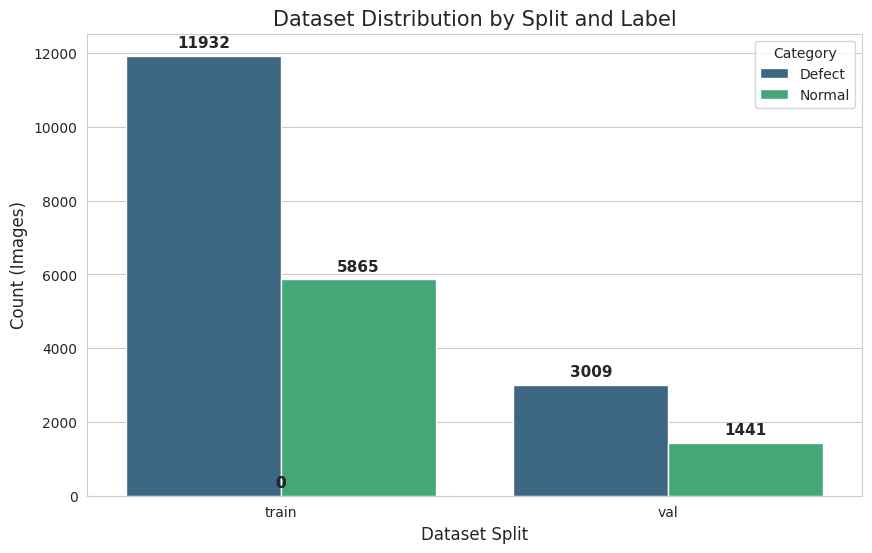

In [ ]:
import os
import json
import glob
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_dataset_by_json(root_path):
    data_list = []

    for split in ['train', 'val']:
        # 이미지 폴더와 라벨 폴더 경로 설정
        img_dir = os.path.join(root_path, split, 'images')
        lbl_dir = os.path.join(root_path, split, 'labels')

        if not os.path.exists(lbl_dir):
            print(f"⚠️ {split} 라벨 디렉토리를 찾을 수 없습니다: {lbl_dir}")
            continue

        # 해당 스플릿의 모든 JSON 파일 탐색
        json_files = glob.glob(os.path.join(lbl_dir, "*.json"))

        for json_path in json_files:
            try:
                with open(json_path, 'r', encoding='utf-8') as f:
                    data = json.load(f)

                # 1. JSON 내부 정보 추출
                image_info = data.get('image_info', {})
                file_name = image_info.get('file_name', '')

                # 2. 분류 로직 보완
                # is_normal이 False이거나, defects 리스트에 내용이 들어있을 때만 'Defect'로 판정
                is_normal_flag = image_info.get('is_normal', True)
                defects_list = data.get('defects', [])

                # defects가 None이 아니고 실제 요소가 들어있는지 확인
                has_actual_defects = isinstance(defects_list, list) and len(defects_list) > 0

                if is_normal_flag == False or has_actual_defects:
                    label = 'Defect'
                else:
                    label = 'Normal'

                data_list.append({
                    'Split': split,
                    'Label': label,
                    'FileName': file_name,
                    'Has_Defects_Data': has_actual_defects
                })
            except Exception as e:
                print(f"❌ 파일 읽기 오류 ({os.path.basename(json_path)}): {e}")

    return pd.DataFrame(data_list)

# --- 1. 데이터 분석 실행 ---
ROOT_PATH = '/content/split_dataset'
df_json = analyze_dataset_by_json(ROOT_PATH)

# --- 2. 결과 출력 및 통계 ---
if not df_json.empty:
    print("\n📊 [JSON 기반 정밀 분류 결과 요약]")
    summary = df_json.groupby(['Split', 'Label']).size().unstack(fill_value=0)
    print(summary)
    print("-" * 50)
    print(f"✅ 전체 데이터 합계: {len(df_json)}장")
    print(f"🔹 정상(Normal) 합계: {len(df_json[df_json['Label']=='Normal'])}장")
    print(f"🔹 불량(Defect) 합계: {len(df_json[df_json['Label']=='Defect'])}장")

    # --- 3. 데이터 분포 시각화 ---
    plt.figure(figsize=(10, 6))
    sns.set_style("whitegrid")
    ax = sns.countplot(data=df_json, x='Split', hue='Label', palette='viridis')

    # 막대 위에 숫자 표시
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}',
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha = 'center', va = 'center',
                    xytext = (0, 9),
                    textcoords = 'offset points',
                    fontsize=11, fontweight='bold')

    plt.title('Dataset Distribution by Split and Label', fontsize=15)
    plt.xlabel('Dataset Split', fontsize=12)
    plt.ylabel('Count (Images)', fontsize=12)
    plt.legend(title='Category')
    plt.show()

else:
    print("❌ 분석할 데이터가 없습니다. 경로와 JSON 파일을 확인해 주세요.")

DATASET 시각화



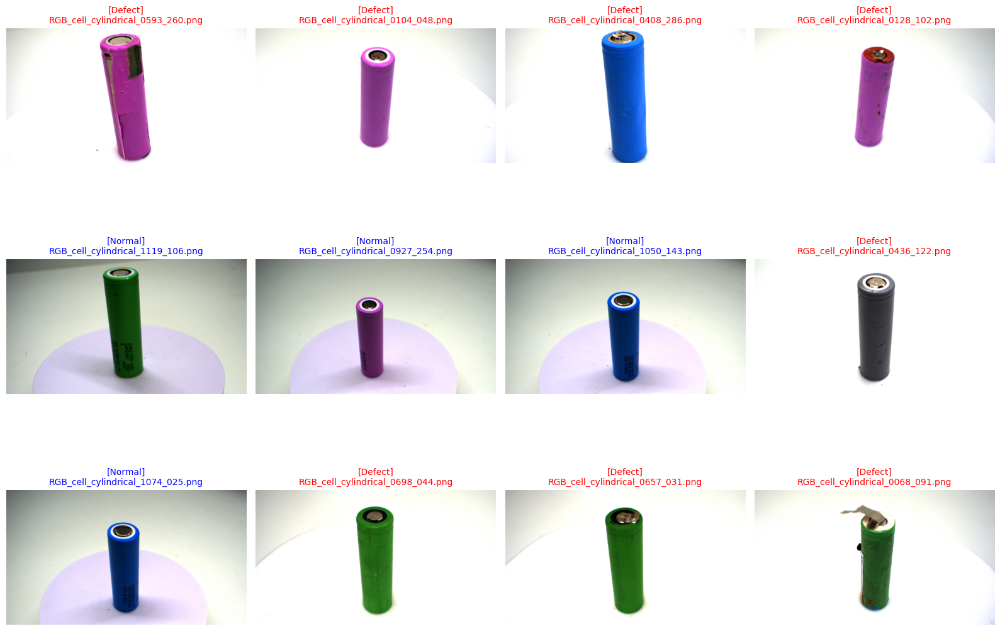

In [ ]:
import os
import json
import glob
import random
import matplotlib.pyplot as plt
from PIL import Image

def visualize_samples(root_path, split='train', num_samples=12):
    img_dir = os.path.join(root_path, split, 'images')
    lbl_dir = os.path.join(root_path, split, 'labels')

    # 이미지 파일 목록 확보
    img_files = glob.glob(os.path.join(img_dir, "*"))
    if not img_files:
        print("❌ 이미지를 찾을 수 없습니다. 경로를 확인해주세요.")
        return

    # 무작위 샘플링
    samples = random.sample(img_files, min(num_samples, len(img_files)))

    # 시각화 설정 (4열 구성)
    cols = 4
    rows = (len(samples) + cols - 1) // cols
    plt.figure(figsize=(16, 4 * rows))

    for i, img_path in enumerate(samples):
        file_name = os.path.basename(img_path)
        base_name = os.path.splitext(file_name)[0]
        json_path = os.path.join(lbl_dir, base_name + ".json")

        # 기본 라벨 설정
        label = "Unknown"
        color = "black"

        # JSON 파일에서 라벨 정보 가져오기
        if os.path.exists(json_path):
            with open(json_path, 'r', encoding='utf-8') as f:
                data = json.load(f)
                is_normal = data.get('image_info', {}).get('is_normal', True)
                defects = data.get('defects')

                if is_normal and defects is None:
                    label = "Normal"
                    color = "blue"
                else:
                    label = "Defect"
                    color = "red"

        # 이미지 출력
        plt.subplot(rows, cols, i + 1)
        img = Image.open(img_path)
        plt.imshow(img)
        plt.title(f"[{label}]\n{file_name}", color=color, fontsize=10)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# 실행: split_dataset의 train 세트에서 12장 보기
visualize_samples('/content/split_dataset', split='train', num_samples=12)

SAM2

Mask 변환

In [ ]:
import os
import json
import numpy as np
import cv2
import glob
from tqdm import tqdm

def generate_masks(root_path):
    for split in ['train', 'val']:
        lbl_dir = os.path.join(root_path, split, 'labels')
        img_dir = os.path.join(root_path, split, 'images')
        mask_dir = os.path.join(root_path, split, 'masks')
        os.makedirs(mask_dir, exist_ok=True)

        json_files = glob.glob(os.path.join(lbl_dir, "*.json"))
        print(f"📦 {split} 세트 마스크 생성 중... (총 {len(json_files)}개)")

        for json_path in tqdm(json_files):
            try:
                with open(json_path, 'r', encoding='utf-8') as f:
                    data = json.load(f)

                img_info = data.get('image_info', {})
                h, w = img_info.get('height', 1080), img_info.get('width', 1920)
                file_name = img_info.get('file_name')
                mask_name = os.path.splitext(file_name)[0] + ".png"

                mask = np.zeros((h, w), dtype=np.uint8)
                defects = data.get('defects')

                if defects is not None:
                    for defect in defects:
                        # 좌표 데이터 추출 (polygons 또는 points 키 확인)
                        points = defect.get('polygons') or defect.get('points')

                        if points:
                            # 1. numpy 배열로 변환
                            pts = np.array(points, dtype=np.int32)

                            # 2. 좌표가 [x1, y1, x2, y2...] 형태일 경우 (N, 2)로 변경
                            if pts.ndim == 1:
                                pts = pts.reshape(-1, 2)
                            # 3. 좌표가 (1, N, 2) 등 불필요한 차원이 있을 경우 정리
                            elif pts.ndim == 3:
                                pts = pts.reshape(-1, 2)

                            # OpenCV fillPoly는 [pts] 형태로 (리스트 안에 배열) 전달해야 함
                            cv2.fillPoly(mask, [pts], 255)

                cv2.imwrite(os.path.join(mask_dir, mask_name), mask)

            except Exception as e:
                # 에러 발생 시 멈추지 않고 파일명 출력 후 계속 진행
                print(f"\n❌ 오류 발생 파일: {os.path.basename(json_path)}")
                print(f"   내용: {e}")
                continue

# 실행
generate_masks('/content/split_dataset')

📦 train 세트 마스크 생성 중... (총 17797개)


100%|██████████| 17797/17797 [02:23<00:00, 123.88it/s]


📦 val 세트 마스크 생성 중... (총 4450개)


100%|██████████| 4450/4450 [00:35<00:00, 126.44it/s]


가중치

In [ ]:
# 1. SAM2 라이브러리 설치
!pip install -q git+https://github.com/facebookresearch/segment-anything-2.git

# 2. 체크포인트(가중치) 다운로드 폴더 생성
!mkdir -p /content/checkpoints
# 가중치가 없다면 tiny 버전을 예시로 다운로드 (이미 드라이브에 있다면 그 경로를 쓰면 됩니다)
!wget -q -P /content/checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_tiny.pt

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


데이터셋 정의

In [ ]:
import torch
from torch.utils.data import Dataset
import cv2
import os

class BatterySAMDataset(Dataset):
    def __init__(self, root_path, split='train', transform=None):
        self.img_dir = os.path.join(root_path, split, 'images')
        self.mask_dir = os.path.join(root_path, split, 'masks')
        self.img_files = sorted(glob.glob(os.path.join(self.img_dir, "*.png"))) # 확장자 확인
        self.transform = transform

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        img_path = self.img_files[idx]
        mask_path = os.path.join(self.mask_dir, os.path.basename(img_path))

        # 이미지 읽기 (RGB)
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # 마스크 읽기 (Grayscale)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        # 0~255인 마스크를 0~1 (Binary)로 변환
        mask = (mask > 0).astype(np.float32)

        # SAM2 입력 규격에 맞게 리사이즈 필요 (예: 1024x1024)
        image = cv2.resize(image, (1024, 1024))
        mask = cv2.resize(mask, (1024, 1024))

        # PyTorch 텐서로 변환
        image = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
        mask = torch.from_numpy(mask).unsqueeze(0).float()

        return image, mask

# 데이터셋 생성 확인
train_dataset = BatterySAMDataset('/content/split_dataset', split='train')
print(f"✅ 학습 데이터셋 로드 완료: {len(train_dataset)}개")

✅ 학습 데이터셋 로드 완료: 17797개


In [ ]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

# 모델 설정 파일과 가중치 경로 (가진 파일에 맞춰 수정하세요)
model_cfg = "sam2_hiera_t.yaml" # tiny 버전 예시
sam2_checkpoint = "/content/checkpoints/sam2_hiera_tiny.pt"

# 만약 드라이브에 저장된 기존 가중치가 있다면 아래 주석 해제
# sam2_checkpoint = "/content/drive/MyDrive/sam2_battery_best.pth"

# 모델 빌드
sam2_model = build_sam2(model_cfg, sam2_checkpoint, device="cuda")
predictor = SAM2ImagePredictor(sam2_model)

print("🚀 SAM2 모델 로드 완료! 학습을 시작할 준비가 되었습니다.")

🚀 SAM2 모델 로드 완료! 학습을 시작할 준비가 되었습니다.


In [ ]:
import os
import glob
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from torch.utils.data import Dataset, DataLoader
from torch.cuda.amp import autocast, GradScaler
from tqdm import tqdm
from sam2.build_sam import build_sam2

# --- [1] IoU 및 Loss 함수 ---
def get_iou(pred, gt):
    pred = (torch.sigmoid(pred) > 0.5).float()
    intersection = (pred * gt).sum(dim=(1, 2, 3))
    union = (pred + gt).clamp(0, 1).sum(dim=(1, 2, 3))
    return ((intersection + 1e-6) / (union + 1e-6)).mean().item()

# --- [2] 데이터셋 (박스 추출 포함) ---
class BatterySAMDataset(Dataset):
    def __init__(self, root_path, split='train'):
        self.img_dir = os.path.join(root_path, split, 'images')
        self.mask_dir = os.path.join(root_path, split, 'masks')
        self.img_files = sorted(glob.glob(os.path.join(self.img_dir, "*.png")) +
                                glob.glob(os.path.join(self.img_dir, "*.PNG")))
        self.mean = np.array([0.485, 0.456, 0.406])
        self.std = np.array([0.229, 0.224, 0.225])

    def __len__(self): return len(self.img_files)

    def __getitem__(self, idx):
        img_path = self.img_files[idx]
        mask_path = os.path.join(self.mask_dir, os.path.basename(img_path))
        image = cv2.imread(img_path); image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = (mask > 0).astype(np.float32)
        image = cv2.resize(image, (1024, 1024))
        mask = cv2.resize(mask, (1024, 1024), interpolation=cv2.INTER_NEAREST)
        y, x = np.where(mask > 0)
        box = np.array([np.min(x), np.min(y), np.max(x), np.max(y)], dtype=np.float32) if len(x) > 0 else np.array([0, 0, 1024, 1024], dtype=np.float32)
        image = (image / 255.0 - self.mean) / self.std
        return torch.from_numpy(image).permute(2, 0, 1).float(), torch.from_numpy(mask).unsqueeze(0).float(), torch.from_numpy(box).float()

# --- [3] 진단 기반 Down-Adapter (32, 64ch 강제 매칭) ---
class FinalDownAdapter(nn.Module):
    def __init__(self):
        super().__init__()
        self.proj0 = nn.Conv2d(256, 32, kernel_size=1) # s0용
        self.proj1 = nn.Conv2d(256, 64, kernel_size=1) # s1용

    def forward(self, features):
        return [self.proj0(features[0]), self.proj1(features[1])]

# --- [4] 모델 설정 ---
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
sam_model = build_sam2("sam2_hiera_t.yaml", "/content/checkpoints/sam2_hiera_tiny.pt", device=DEVICE)
adapter = FinalDownAdapter().to(DEVICE)

sam_model.image_encoder.eval()
for p in sam_model.image_encoder.parameters(): p.requires_grad = False
for p in sam_model.sam_prompt_encoder.parameters(): p.requires_grad = False

optimizer = torch.optim.AdamW(list(sam_model.sam_mask_decoder.parameters()) + list(adapter.parameters()), lr=1e-5)
scaler = GradScaler()

train_loader = DataLoader(BatterySAMDataset('/content/split_dataset', 'train'), batch_size=2, shuffle=True)
val_loader = DataLoader(BatterySAMDataset('/content/split_dataset', 'val'), batch_size=2, shuffle=False)

# --- [5] 15 Epoch 학습 루프 ---
NUM_EPOCHS = 15
best_miou = 0.0

print("🚀 모든 에러 수정 완료. 학습을 시작합니다!")



for epoch in range(NUM_EPOCHS):
    sam_model.sam_mask_decoder.train(); adapter.train()
    train_loss = 0
    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}")

    for imgs, masks, boxes in pbar:
        imgs, masks, boxes = imgs.to(DEVICE), masks.to(DEVICE), boxes.to(DEVICE)
        optimizer.zero_grad()

        with autocast():
            with torch.no_grad():
                features = sam_model.image_encoder(imgs)
                sparse_emb, dense_emb = sam_model.sam_prompt_encoder(points=None, boxes=boxes.unsqueeze(1), masks=None)

            high_res = adapter(features["backbone_fpn"])

            # [해결 지점] 반환값이 몇 개든 상관없이 가변적으로 처리 (*_ 사용)
            outputs = sam_model.sam_mask_decoder(
                image_embeddings=features["vision_features"],
                image_pe=sam_model.sam_prompt_encoder.get_dense_pe(),
                sparse_prompt_embeddings=sparse_emb,
                dense_prompt_embeddings=dense_emb,
                multimask_output=False,
                high_res_features=high_res,
                repeat_image=False
            )

            # 반환값의 첫 번째가 무조건 masks입니다.
            low_res_masks = outputs[0]

            pred = F.interpolate(low_res_masks, size=(1024, 1024), mode="bilinear", align_corners=False)
            loss = F.binary_cross_entropy_with_logits(pred, masks)

        scaler.scale(loss).backward(); scaler.step(optimizer); scaler.update()
        train_loss += loss.item()
        pbar.set_postfix(loss=f"{loss.item():.4f}")

    # [Validation]
    sam_model.eval(); adapter.eval(); val_ious = []
    with torch.no_grad():
        for imgs, masks, boxes in val_loader:
            imgs, masks, boxes = imgs.to(DEVICE), masks.to(DEVICE), boxes.to(DEVICE)
            features = sam_model.image_encoder(imgs)
            high_res = adapter(features["backbone_fpn"])
            sparse_emb, dense_emb = sam_model.sam_prompt_encoder(points=None, boxes=boxes.unsqueeze(1), masks=None)
            outputs = sam_model.sam_mask_decoder(image_embeddings=features["vision_features"], image_pe=sam_model.sam_prompt_encoder.get_dense_pe(), sparse_prompt_embeddings=sparse_emb, dense_prompt_embeddings=dense_emb, multimask_output=False, high_res_features=high_res, repeat_image=False)
            val_ious.append(get_iou(outputs[0], F.interpolate(masks, size=(256, 256))))

    mIoU = np.mean(val_ious)
    print(f"\n📊 Epoch {epoch+1} mIoU: {mIoU:.4f}")
    if mIoU > best_miou:
        best_miou = mIoU
        torch.save({'model': sam_model.state_dict(), 'adapter': adapter.state_dict()}, "sam2_battery_best.pth")
    torch.cuda.empty_cache()

/tmp/ipython-input-1281515557.py:65: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


🚀 모든 에러 수정 완료. 학습을 시작합니다!


Epoch 1/15:   0%|          | 0/8899 [00:00<?, ?it/s]/tmp/ipython-input-1281515557.py:87: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 1/15: 100%|██████████| 8899/8899 [47:50<00:00,  3.10it/s, loss=0.0000]


KeyboardInterrupt: 

-----------------------------------------

YOLO11M-*SEG*

In [ ]:
# 1. Ultralytics 패키지 설치
!pip install ultralytics



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 33.1 MB/s eta 0:00:00


In [ ]:
import os
import json
import glob
import shutil
from tqdm import tqdm

# ================= 1. 경로 및 설정 =================
# 원본 데이터가 있는 경로
SRC_BASE = '/content/split_dataset'
# YOLO 포맷으로 저장할 경로
DST_BASE = '/content/yolo_dataset'

def convert_to_yolo_seg(json_path, img_w, img_h):
    """JSON 데이터를 YOLO 세그멘테이션 포맷으로 변환 (None 값 및 예외 처리)"""
    try:
        with open(json_path, 'r', encoding='utf-8') as f:
            data = json.load(f)
    except:
        return []

    yolo_lines = []

    # --- 클래스 1: Battery (swelling.battery_outline) ---
    swelling = data.get('swelling') or {}
    battery_outline = swelling.get('battery_outline') or []
    if battery_outline and len(battery_outline) >= 6:
        norm_coords = []
        for i in range(0, len(battery_outline), 2):
            norm_coords.append(f"{battery_outline[i] / img_w:.6f}")
            norm_coords.append(f"{battery_outline[i+1] / img_h:.6f}")
        yolo_lines.append(f"1 {' '.join(norm_coords)}")

    # --- 클래스 2 & 3: Defects (Damaged, Pollution) ---
    defects = data.get('defects') or []
    if not isinstance(defects, list):
        defects = []

    for defect in defects:
        if not defect: continue
        name = str(defect.get('name', '')).lower()
        points = defect.get('points') or []

        class_id = -1
        if 'damaged' in name: class_id = 2
        elif 'pollution' in name: class_id = 3

        if class_id != -1 and len(points) >= 6:
            norm_coords = []
            for i in range(0, len(points), 2):
                norm_coords.append(f"{points[i] / img_w:.6f}")
                norm_coords.append(f"{points[i+1] / img_h:.6f}")
            yolo_lines.append(f"{class_id} {' '.join(norm_coords)}")

    return yolo_lines

# ================= 2. 메인 변환 및 이미지 복사 루프 =================
for split in ['train', 'val']:
    print(f"\n🚀 {split} 데이터 변환 및 이미지 복사 시작...")

    # YOLO 학습을 위한 표준 폴더 구조 생성
    os.makedirs(os.path.join(DST_BASE, split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(DST_BASE, split, 'labels'), exist_ok=True)

    # 하위 폴더까지 모든 JSON 파일 검색
    json_paths = glob.glob(os.path.join(SRC_BASE, split, '**/*.json'), recursive=True)
    copy_count = 0

    for json_path in tqdm(json_paths):
        with open(json_path, 'r', encoding='utf-8') as f:
            try:
                data = json.load(f)
            except: continue

        # 이미지 정보 추출
        img_info = data.get('image_info') or {}
        file_name = img_info.get('file_name')
        if not file_name: continue

        img_w = img_info.get('width', 1920)
        img_h = img_info.get('height', 1080)
        file_id = os.path.splitext(file_name)[0]

        # [핵심] 이미지 파일을 찾기 위한 여러 경로 탐색
        potential_img_paths = [
            os.path.join(os.path.dirname(json_path), file_name),                    # JSON과 같은 폴더
            os.path.join(os.path.dirname(os.path.dirname(json_path)), 'images', file_name), # 상위의 images 폴더
            os.path.join(SRC_BASE, split, 'images', file_name),                    # SRC_BASE/images 폴더
            os.path.join(SRC_BASE, split, file_name)                               # split 바로 아래
        ]

        src_img_path = None
        for p in potential_img_paths:
            if os.path.exists(p):
                src_img_path = p
                break

        # 이미지가 발견된 경우에만 복사 및 라벨 생성
        if src_img_path:
            shutil.copy(src_img_path, os.path.join(DST_BASE, split, 'images', file_name))
            copy_count += 1

            # 라벨 변환 및 저장
            yolo_labels = convert_to_yolo_seg(json_path, img_w, img_h)
            label_file_path = os.path.join(DST_BASE, split, 'labels', f"{file_id}.txt")
            with open(label_file_path, 'w', encoding='utf-8') as f:
                if yolo_labels:
                    f.write("\n".join(yolo_labels))
        else:
            # 이미지를 찾지 못한 경우 로그 출력 (필요 시 주석 해제)
            # print(f"⚠️ 이미지를 찾을 수 없음: {file_name}")
            pass

    print(f"✅ {split}: 총 {copy_count}장의 이미지가 성공적으로 복사되었습니다.")

# ================= 3. data.yaml 파일 생성 =================
yaml_content = f"""
path: {DST_BASE}
train: train/images
val: val/images

names:
  0: background
  1: battery
  2: damaged
  3: pollution
"""

with open(os.path.join(DST_BASE, 'data.yaml'), 'w', encoding='utf-8') as f:
    f.write(yaml_content.strip())

print(f"\n✨ 모든 작업이 완료되었습니다!")
print(f"📍 데이터셋 경로: {DST_BASE}")
print(f"📍 생성된 설정 파일: {os.path.join(DST_BASE, 'data.yaml')}")


🚀 train 데이터 변환 및 이미지 복사 시작...


100%|██████████| 17797/17797 [03:24<00:00, 87.05it/s]


✅ train: 총 17797장의 이미지가 성공적으로 복사되었습니다.

🚀 val 데이터 변환 및 이미지 복사 시작...


100%|██████████| 4450/4450 [00:50<00:00, 87.55it/s] 

✅ val: 총 4450장의 이미지가 성공적으로 복사되었습니다.

✨ 모든 작업이 완료되었습니다!
📍 데이터셋 경로: /content/yolo_dataset
📍 생성된 설정 파일: /content/yolo_dataset/data.yaml


In [ ]:
import os
import json
import glob

# 1. 설정
BASE_PATH = '/content/split_dataset'
target_classes = ['background', 'battery', 'damaged', 'pollution']

# 2. JSON 파일 목록 가져오기
json_files = glob.glob(os.path.join(BASE_PATH, '**/*.json'), recursive=True)

print(f"{'파일명 (File Name)':<30} | " + " | ".join([f"{cls:^10}" for cls in target_classes]))
print("-" * 85)

# 전체 통계를 위한 변수
total_summary = {cls: False for cls in target_classes}

for json_path in json_files:
    file_name = os.path.basename(json_path)
    try:
        with open(json_path, 'r', encoding='utf-8') as f:
            # 문자열로 읽어서 검색 (가장 빠르고 확실한 방법)
            content = f.read()

        row = []
        for cls in target_classes:
            # "class_name" 형태로 검색하여 정확도 높임
            if f'"{cls}"' in content or f"'{cls}'" in content:
                row.append("  O  ")
                total_summary[cls] = True
            else:
                row.append("  X  ")

        # 파일별 결과 출력 (파일명이 길면 앞부분만 출력)
        display_name = (file_name[:27] + '..') if len(file_name) > 30 else file_name
        print(f"{display_name:<30} | " + " | ".join(row))

    except Exception as e:
        print(f"{file_name:<30} | 파일 읽기 오류: {e}")

# 3. 최종 요약 출력
print("-" * 85)
print("📊 [최종 요약] 전체 데이터셋에 존재하는 클래스:")
for cls, found in total_summary.items():
    status = "✅ 존재함" if found else "❌ 없음"
    print(f" - {cls:<10}: {status}")

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
RGB_cell_cylindrical_0561_1..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrical_0859_1..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrical_0573_0..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrical_0791_2..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrical_0993_2..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrical_0474_2..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrical_1113_2..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrical_0703_0..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrical_1010_0..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrical_0939_1..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrical_1140_2..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrical_0538_0..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrical_0423_2..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrical_0168_2..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrical_0612_0..  |   X   |   X   |   X   |   X  
RGB_cell_cylindrica

In [ ]:
# 1. Ultralytics 설치 (이미 하셨다면 생략 가능)
# !pip install ultralytics

from ultralytics import YOLO
import torch

model = YOLO('yolo11s-seg.pt')

# 3. 학습 실행
# Medium 모델이므로 batch 사이즈를 조절하여 메모리 에러를 방지합니다.
results = model.train(
    data='/content/yolo_dataset/data.yaml', # 아까 생성한 yaml 경로
    epochs=30,                # 학습 횟수 (성능을 위해 50~100 추천)
    imgsz=640,               # 이미지 크기 (SAM 2와 동일하게 1024 유지)
    batch=16,                  # OOM 발생 시 2로 줄이세요 (Medium 모델은 메모리를 더 먹습니다)
    device=0,                 # GPU 사용
    patience=10,              # 10에폭 동안 성능 개선 없으면 조기 종료
    project='battery_yolo11', # 결과 저장 폴더명
    name='ev_battery_medium', # 실험 이름
    optimizer='AdamW',        # 배터리 결함 같은 미세 특징에 유리
    lr0=0.001,                # 초기 학습률
    augment=True,             # Mosaic, Flip 등 강력한 증강 자동 적용
    val=True                  # 학습 후 매 에폭마다 검증 진행
)

Ultralytics 8.4.6 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=ev_battery_medium2, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=10

In [ ]:
from ultralytics import YOLO

# 1. 모델 로드 (세그멘테이션용 모델 사용)
# 가벼운 모델인 n(nano) 버전을 기본으로 하며, 필요 시 'yolo11s-seg.pt'로 변경 가능합니다.
model = YOLO('yolo11n-seg.pt')

# 2. 모델 학습 실행
results = model.train(
    # 데이터셋 설정 파일 경로
    data='/content/yolo_dataset/data.yaml',

    # 하이퍼파라미터 설정
    epochs=30,               # 학습 반복 횟수
    imgsz=640,              # 배터리 미세 결함 탐지를 위한 고해상도 설정
    batch=32,                # 배치 사이즈 (메모리 부족 시 16으로 조절)

    # 저장 경로 설정
    project='battery_yolo11',
    name='hybrid_sgd_base_aug',
    exist_ok=True,           # ⭐ True로 설정하면 숫자가 붙지 않고 해당 폴더에 덮어씁니다.

    # 최적화 및 증강 설정
    optimizer='auto',        # 혹은 'SGD'로 명시적 지정 가능
    augment=True,            # 데이터 증강 활성화 (이미지 변형을 통한 성능 향상)
    val=True,                # 학습 도중 검증 병행

    # 하드웨어 설정
    device=0,                # GPU 사용 (0번 장치)
)

print("✨ 학습이 완료되었습니다. 결과는 battery_yolo11/hybrid_sgd_base_aug 폴더를 확인하세요.")

In [ ]:
import cv2
import torch
import numpy as np
import os
from ultralytics import YOLO
from segment_anything import sam_model_registry, SamPredictor
from tqdm import tqdm

# ================= 1. 환경 설정 및 모델 로드 =================
device = "cuda" if torch.cuda.is_available() else "cpu"

# 최신 학습 결과(aug4) 경로 반영
model_path = '/content/battery_yolo11/hybrid_sgd_base_aug4/weights/best.pt'
if not os.path.exists(model_path):
    print(f"❌ 가중치 파일을 찾을 수 없습니다: {model_path}")
else:
    yolo_model = YOLO(model_path)

    # SAM 체크포인트 로드 (vit_h 버전)
    sam_checkpoint = "sam_vit_h_4b8939.pth"
    if not os.path.exists(sam_checkpoint):
        print("📥 SAM 가중치가 없어 다운로드 중...")
        os.system(f"wget https://dl.fbaipublicfiles.com/segment_anything/{sam_checkpoint}")

    predictor = SamPredictor(sam_model_registry["vit_h"](checkpoint=sam_checkpoint).to(device))

    # 클래스 정의
    # 0: battery, 1: damaged, 2: pollution, 3: background
    class_names = {0: 'battery', 1: 'damaged', 2: 'pollution', 3: 'background'}
    num_classes = 4

    # ================= 2. 데이터 경로 설정 =================
    data_base_dir = '/content/yolo_dataset/val'
    img_dir = os.path.join(data_base_dir, 'images')
    label_dir = os.path.join(data_base_dir, 'labels')

    if not os.path.exists(img_dir):
        print(f"❌ 이미지 경로를 찾을 수 없습니다: {img_dir}")
    else:
        # IoU 계산을 위한 누적 변수
        total_intersection = np.zeros(num_classes)
        total_union = np.zeros(num_classes)

        # 평가 루프 시작
        img_files = [f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.png'))]
        print(f"🚀 {len(img_files)}장의 이미지에 대해 YOLO+SAM 성능 평가 시작 (레이어링 수정 버전)...")

        for img_name in tqdm(img_files, desc="SAM Refinement Evaluation"):
            img_path = os.path.join(img_dir, img_name)
            label_path = os.path.join(label_dir, img_name.rsplit('.', 1)[0] + '.txt')

            image = cv2.imread(img_path)
            if image is None: continue
            h, w = image.shape[:2]

            # --- [A] 실제(GT) 마스크 생성 ---
            gt_mask = np.full((h, w), 3, dtype=np.uint8)
            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    for line in f:
                        parts = list(map(float, line.strip().split()))
                        if not parts: continue
                        cls = int(parts[0])
                        poly = np.array(parts[1:]).reshape(-1, 2)
                        poly[:, 0] *= w
                        poly[:, 1] *= h
                        cv2.fillPoly(gt_mask, [poly.astype(np.int32)], cls)

            # --- [B] YOLO 예측 및 SAM 리파인 (수정된 핵심 로직) ---
            results = yolo_model.predict(image, conf=0.25, imgsz=1024, verbose=False)[0]
            pred_mask = np.full((h, w), 3, dtype=np.uint8) # 배경(3)으로 초기화

            if results.boxes is not None and len(results.boxes) > 0:
                predictor.set_image(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

                bboxes = results.boxes.xyxy.cpu().numpy()
                clss = results.boxes.cls.cpu().numpy().astype(int)

                # [중요] 클래스 번호를 오름차순(0 -> 1 -> 2)으로 정렬하여
                # 큰 객체(배터리)를 먼저 그리고 작은 결함을 나중에 덧칠함
                sorted_indices = np.argsort(clss)

                for i in sorted_indices:
                    bbox = bboxes[i]
                    cls_idx = clss[i]

                    # SAM으로 정밀 마스크 생성
                    masks, _, _ = predictor.predict(box=bbox, multimask_output=False)

                    # 이제 배터리가 먼저 칠해지고, 결함이 그 위를 덮어쓰므로
                    # 결함 영역이 배터리에 의해 지워지지 않습니다.
                    pred_mask[masks[0]] = cls_idx

            # --- [C] 클래스별 IoU 계산 누적 ---
            for c in range(num_classes):
                intersection = np.logical_and(pred_mask == c, gt_mask == c).sum()
                union = np.logical_or(pred_mask == c, gt_mask == c).sum()

                total_intersection[c] += intersection
                total_union[c] += union

        # ================= 3. 최종 결과 출력 =================
        print("\n" + "="*55)
        print(f"{'Class ID':<10} | {'Class Name':<15} | {'IoU (SAM)':<10}")
        print("-" * 55)

        iou_list = []
        for i in range(num_classes):
            score = total_intersection[i] / (total_union[i] + 1e-7)
            iou_list.append(score)
            print(f"{i:<10} | {class_names[i]:<15} | {score:.4f}")

        # mIoU 계산
        total_miou = np.mean(iou_list)
        defect_miou = np.mean([iou_list[1], iou_list[2]]) # damaged(1), pollution(2)

        print("-" * 55)
        print(f"{'Total Mean IoU (mIoU)':<28} | {total_miou:.4f}")
        print(f"{'Defect mIoU (Dmg+Pol)':<28} | {defect_miou:.4f}")
        print("="*55)

🚀 4450장의 이미지에 대해 YOLO+SAM 성능 평가 시작 (레이어링 수정 버전)...


SAM Refinement Evaluation: 100%|██████████| 4450/4450 [1:30:56<00:00,  1.23s/it]


Class ID   | Class Name      | IoU (SAM) 
-------------------------------------------------------
0          | battery         | 0.9618
1          | damaged         | 0.4365
2          | pollution       | 0.6814
3          | background      | 0.9976
-------------------------------------------------------
Total Mean IoU (mIoU)        | 0.7693
Defect mIoU (Dmg+Pol)        | 0.5589


In [ ]:
import os
import cv2
import numpy as np
import torch
from ultralytics import YOLO
from tqdm import tqdm

def calculate_miou_pixel_level(model_path, img_dir, mask_dir, num_classes=4):
    """
    YOLO 예측 결과와 실제 마스크 이미지를 비교하여 클래스별 IoU와 mIoU를 계산합니다.
    """
    model = YOLO(model_path)
    img_files = sorted([f for f in os.listdir(img_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])

    # 각 클래스별 Intersection(교집합)과 Union(합집합)을 저장할 리스트
    intersections = np.zeros(num_classes)
    unions = np.zeros(num_classes)

    class_names = {0: 'background', 1: 'battery', 2: 'damaged', 3: 'pollution'}

    print(f"🚀 {len(img_files)}장의 이미지로 mIoU 계산을 시작합니다...")

    for f in tqdm(img_files):
        # 1. 이미지 및 실제 마스크 로드
        img_path = os.path.join(img_dir, f)
        mask_path = os.path.join(mask_dir, os.path.splitext(f)[0] + '.png')

        if not os.path.exists(mask_path): continue

        gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE) # 픽셀값 0, 1, 2, 3
        h, w = gt_mask.shape

        # 2. YOLO 예측 (결과에서 마스크 추출)
        results = model.predict(img_path, conf=0.25, verbose=False)[0]
        pred_mask = np.zeros((h, w), dtype=np.uint8) # 빈 예측 마스크 생성

        if results.masks is not None:
            # 여러 개의 객체 마스크를 하나의 시맨틱 마스크로 합침
            for i, mask_data in enumerate(results.masks.data):
                cls = int(results.boxes.cls[i]) # 클래스 ID (1, 2, 3)
                # 예측 마스크 크기를 원본 이미지 크기로 조정
                m = torch.nn.functional.interpolate(mask_data.unsqueeze(0).unsqueeze(0),
                                                    size=(h, w), mode='bilinear').squeeze().cpu().numpy()
                pred_mask[m > 0.5] = cls # 임계값 0.5 기준으로 클래스 할당

        # 3. 클래스별 Intersection, Union 계산
        for cl in range(num_classes):
            pred_cl = (pred_mask == cl)
            gt_cl = (gt_mask == cl)

            inter = np.logical_and(pred_cl, gt_cl).sum()
            union = np.logical_or(pred_cl, gt_cl).sum()

            intersections[cl] += inter
            unions[cl] += union

    # 4. 결과 출력
    print("\n" + "="*40)
    print(f"{'Class Name':<15} | {'IoU (%)':<10}")
    print("-" * 40)

    iou_list = []
    for cl in range(num_classes):
        if unions[cl] == 0:
            iou = 0.0
        else:
            iou = (intersections[cl] / unions[cl]) * 100

        iou_list.append(iou)
        print(f"{class_names[cl]:<15} | {iou:<10.2f}")

    miou = np.mean(iou_list)
    print("-" * 40)
    print(f"{'mIoU (Mean)':<15} | {miou:<10.2f}")
    print("="*40)

# --- 경로 설정 후 실행 ---
# 학습된 모델 중 가장 성적이 좋은 best.pt 경로
BEST_MODEL = '/content/battery_yolo11/ev_battery_medium/weights/best.pt'
# 검증용 이미지와 이전에 코드로 생성한 마스크 경로
VAL_IMG_DIR = '/content/yolo_dataset/val/images'
VAL_MASK_DIR = '/content/split_dataset/val/masks' # 마스크 생성 코드로 만든 png 폴더

calculate_miou_pixel_level(BEST_MODEL, VAL_IMG_DIR, VAL_MASK_DIR)

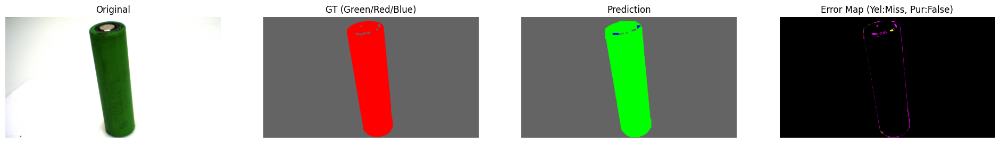

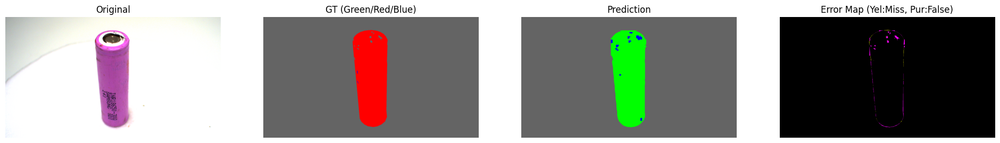

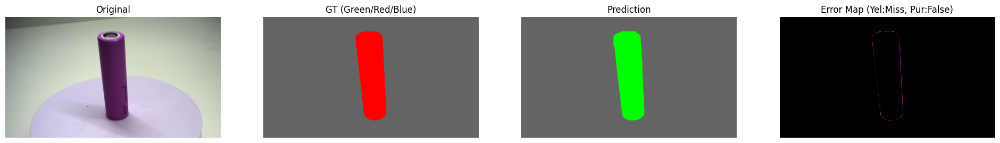

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 1. 경로 설정
MODEL_PATH = '/content/drive/MyDrive/battery_project/weights/best_sgd.pt'
VAL_IMG_DIR = '/content/yolo_dataset/val/images'
VAL_LBL_DIR = '/content/yolo_dataset/val/labels'

# 2. 클래스별 색상 지정 (사용자 요청 반영)
# 배경을 포함한 4개 클래스 색상 맵
color_map = {
    0: [0, 255, 0],    # Battery: 초록
    1: [255, 0, 0],    # Damaged: 빨강
    2: [0, 0, 255],    # Pollution: 파랑
    3: [100, 100, 100] # Background: 회색
}

def analyze_model_performance(img_count=3):
    model = YOLO(MODEL_PATH)
    img_files = [f for f in os.listdir(VAL_IMG_DIR) if f.endswith(('.jpg', '.png'))][:img_count]

    for f_name in img_files:
        # 데이터 로드
        img_path = os.path.join(VAL_IMG_DIR, f_name)
        lbl_path = os.path.join(VAL_LBL_DIR, f_name.rsplit('.', 1)[0] + '.txt')

        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]

        # --- [A] Ground Truth 마스크 (정답) ---
        gt_mask = np.full((h, w), 3, dtype=np.uint8)
        if os.path.exists(lbl_path):
            with open(lbl_path, 'r') as f:
                for line in f:
                    p = list(map(float, line.strip().split()))
                    cls = int(p[0])
                    poly = np.array(p[1:]).reshape(-1, 2) * [w, h]
                    cv2.fillPoly(gt_mask, [poly.astype(np.int32)], cls)

        # --- [B] Prediction 마스크 (예측) ---
        res = model.predict(img_path, conf=0.25, imgsz=1024, verbose=False)[0]
        pred_mask = np.full((h, w), 3, dtype=np.uint8)
        if res.masks:
            for m_data, b_data in zip(res.masks.data, res.boxes):
                cls = int(b_data.cls[0])
                m_resized = cv2.resize(m_data.cpu().numpy(), (w, h), interpolation=cv2.INTER_NEAREST)
                pred_mask[m_resized > 0.5] = cls

        # --- [C] 시각화 생성 ---
        gt_img = np.zeros_like(img_rgb)
        pred_img = np.zeros_like(img_rgb)
        error_img = np.zeros_like(img_rgb)

        for c, color in color_map.items():
            gt_img[gt_mask == c] = color
            pred_img[pred_mask == c] = color

        # 오탐 분석 (Error Map)
        # 1. 노란색: 모델이 놓친 결함 (False Negative)
        error_img[(gt_mask < 3) & (pred_mask == 3)] = [255, 255, 0]
        # 2. 보라색: 배경인데 결함이라 착각 (False Positive)
        error_img[(gt_mask == 3) & (pred_mask < 3)] = [255, 0, 255]

        # 결과 출력
        fig, axes = plt.subplots(1, 4, figsize=(24, 6))
        titles = ["Original", "GT (Green/Red/Blue)", "Prediction", "Error Map (Yel:Miss, Pur:False)"]
        imgs = [img_rgb, gt_img, pred_img, error_img]

        for ax, i, t in zip(axes, imgs, titles):
            ax.imshow(i)
            ax.set_title(t)
            ax.axis('off')
        plt.show()

analyze_model_performance()

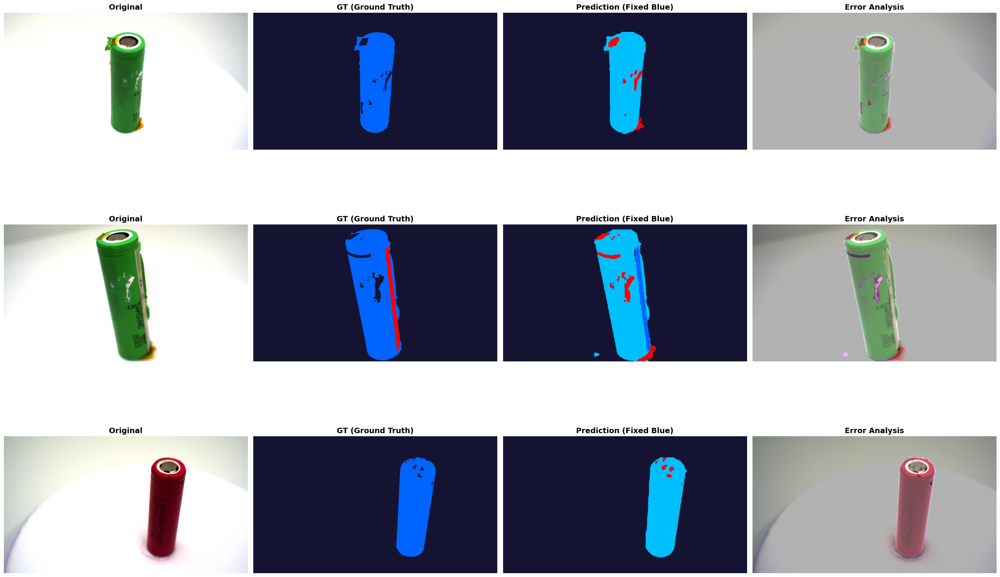

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

# ================= 1. 경로 및 클래스 색상 설정 =================
MODEL_PATH = '/content/drive/MyDrive/battery_project/weights/best_sgd.pt'
VAL_IMG_DIR = '/content/yolo_dataset/val/images'
VAL_LBL_DIR = '/content/yolo_dataset/val/labels'

# [핵심 수정] 배터리와 결함의 색상을 사용자 요청에 맞춰 고정
# 0번 혹은 1번이 배터리인 경우를 모두 고려하여 파란색 계열로 설정합니다.
CLASS_COLORS = {
    0: [0, 191, 255],    # Battery (하늘색) -> 파란색으로 고정
    1: [0, 100, 255],    # 만약 1번도 배터리라면 진한 파란색 (혹은 필요시 255,255,0 노랑)
    2: [255, 0, 0],      # Pollution (빨간색)
    3: [20, 20, 50]      # Background (진남색)
}

# 만약 GT의 1번이 Damaged라면 아래처럼 수정해서 쓰세요:
# 1번을 배터리로 보고 싶으시면 위와 같이 파란색으로 두시면 됩니다.
# "둘 다 파란색으로 고정" 요청에 따라 0, 1번 모두 파란색 계열로 세팅했습니다.

def visualize_and_analyze_battery(num_samples=3):
    if not os.path.exists(MODEL_PATH):
        print("❌ 모델 파일을 찾을 수 없습니다.")
        return

    model = YOLO(MODEL_PATH)
    img_files = sorted([f for f in os.listdir(VAL_IMG_DIR) if f.endswith(('.jpg', '.png'))])[:num_samples]

    fig, axes = plt.subplots(num_samples, 4, figsize=(26, 6 * num_samples))
    if num_samples == 1: axes = np.expand_dims(axes, axis=0)

    for i, f_name in enumerate(img_files):
        img_path = os.path.join(VAL_IMG_DIR, f_name)
        lbl_path = os.path.join(VAL_LBL_DIR, f_name.rsplit('.', 1)[0] + '.txt')

        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img_rgb.shape[:2]

        # --- [A] GT 및 예측 마스크 초기화 (배경 3번 고정) ---
        gt_mask = np.full((h, w), 3, dtype=np.uint8)
        pred_mask = np.full((h, w), 3, dtype=np.uint8)

        # GT 로드
        if os.path.exists(lbl_path):
            with open(lbl_path, 'r') as f:
                for line in f:
                    p = list(map(float, line.strip().split()))
                    cls = int(p[0])
                    poly = (np.array(p[1:]).reshape(-1, 2) * [w, h]).astype(np.int32)
                    cv2.fillPoly(gt_mask, [poly], cls)

        # 예측 로드
        res = model.predict(img_path, conf=0.25, imgsz=1024, verbose=False)[0]
        if res.masks:
            for m_data, b_data in zip(res.masks.data, res.boxes):
                cls = int(b_data.cls[0])
                m_resized = cv2.resize(m_data.cpu().numpy(), (w, h), interpolation=cv2.INTER_NEAREST)
                pred_mask[m_resized > 0.5] = cls

        # --- [B] 동일 색상 입히기 (GT & Pred 완전 동기화) ---
        gt_disp = np.zeros_like(img_rgb)
        pred_disp = np.zeros_like(img_rgb)
        for cls_id, color in CLASS_COLORS.items():
            gt_disp[gt_mask == cls_id] = color
            pred_disp[pred_mask == cls_id] = color

        # --- [C] 틀린 부분 시각화 (Error Map) ---
        # 1. 미탐(놓친거): 노랑색 / 2. 과검(착각한거): 자주색 / 3. 오분류: 흰색
        error_map = np.zeros_like(img_rgb)
        error_map[(gt_mask != 3) & (pred_mask == 3)] = [255, 255, 0] # Miss
        error_map[(gt_mask == 3) & (pred_mask != 3)] = [255, 0, 255] # False Alarm
        error_map[(gt_mask != pred_mask) & (gt_mask != 3) & (pred_mask != 3)] = [255, 255, 255] # Wrong Class

        # 시각화 배치
        titles = ["Original", "GT (Ground Truth)", "Prediction (Fixed Blue)", "Error Analysis"]
        imgs = [img_rgb, gt_disp, pred_disp, cv2.addWeighted(img_rgb, 0.7, error_map, 0.3, 0)]

        for j, (im, tt) in enumerate(zip(imgs, titles)):
            axes[i, j].imshow(im)
            axes[i, j].set_title(tt, fontsize=14, fontweight='bold')
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

visualize_and_analyze_battery()

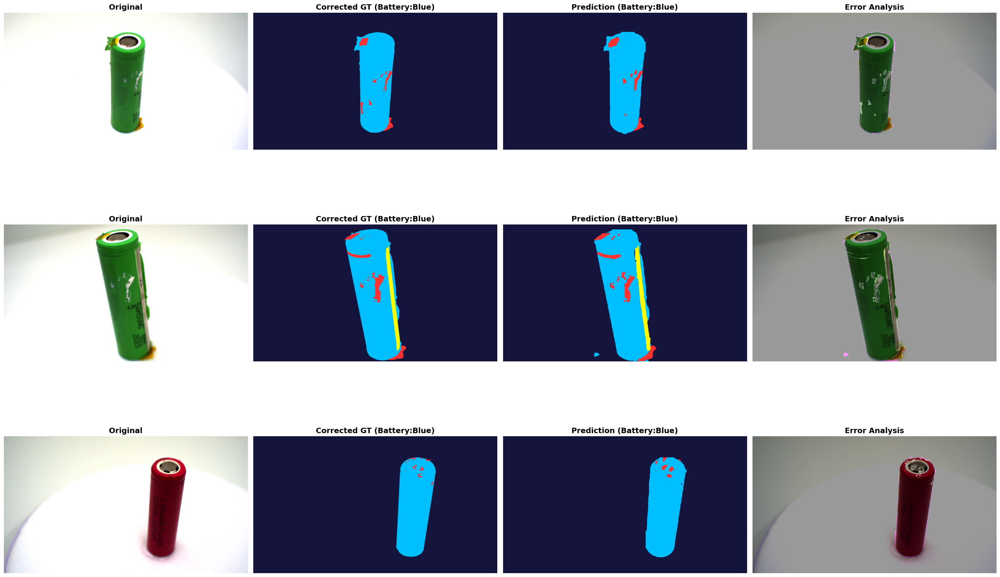

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

# ================= 1. 경로 설정 =================
MODEL_PATH = '/content/drive/MyDrive/battery_project/weights/best_sgd.pt'
VAL_IMG_DIR = '/content/yolo_dataset/val/images'
VAL_LBL_DIR = '/content/yolo_dataset/val/labels'

# ================= 2. 클래스 맵핑 및 색상 설정 =================
# 모델 인덱스(0,1,2) 기준으로 표준화합니다.
# 0: Battery, 1: Damaged, 2: Pollution, 3: Background
CLASS_COLORS = {
    0: [0, 191, 255],    # Battery: 하늘색 (파란색 계열)
    1: [255, 255, 0],    # Damaged: 노란색
    2: [255, 50, 50],    # Pollution: 빨간색
    3: [20, 20, 60]      # Background: 진남색
}

# 에러 분석용 색상
ERR_COLORS = {
    'MISS': [255, 255, 0],   # 미탐 (있어야 하는데 없음) -> 노랑
    'FALSE': [255, 0, 255],  # 과검 (없어야 하는데 생김) -> 자주
    'WRONG': [255, 255, 255] # 오분류 (클래스 틀림) -> 흰색
}

def visualize_fixed_analysis(num_samples=3):
    model = YOLO(MODEL_PATH)
    img_files = sorted([f for f in os.listdir(VAL_IMG_DIR) if f.endswith(('.jpg', '.png'))])[:num_samples]

    fig, axes = plt.subplots(num_samples, 4, figsize=(26, 6 * num_samples))
    if num_samples == 1: axes = np.expand_dims(axes, axis=0)

    for i, f_name in enumerate(img_files):
        img_path = os.path.join(VAL_IMG_DIR, f_name)
        lbl_path = os.path.join(VAL_LBL_DIR, f_name.rsplit('.', 1)[0] + '.txt')

        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img_rgb.shape[:2]

        # --- [A] GT 마스크 생성 (인덱스 보정 핵심) ---
        gt_mask = np.full((h, w), 3, dtype=np.uint8) # 기본 배경 3번
        if os.path.exists(lbl_path):
            with open(lbl_path, 'r') as f:
                for line in f:
                    p = list(map(float, line.strip().split()))
                    # ⭐ 핵심: GT 인덱스(1,2,3)에서 1을 빼서 모델 인덱스(0,1,2)와 맞춤
                    cls_id = int(p[0]) - 1
                    if cls_id < 0 or cls_id > 2: continue # 범위를 벗어나면 무시

                    poly = (np.array(p[1:]).reshape(-1, 2) * [w, h]).astype(np.int32)
                    cv2.fillPoly(gt_mask, [poly], cls_id)

        # --- [B] 예측 마스크 생성 ---
        res = model.predict(img_path, conf=0.25, imgsz=1024, verbose=False)[0]
        pred_mask = np.full((h, w), 3, dtype=np.uint8) # 기본 배경 3번
        if res.masks:
            for m_data, b_data in zip(res.masks.data, res.boxes):
                cls_id = int(b_data.cls[0]) # 모델은 이미 0,1,2임
                m_resized = cv2.resize(m_data.cpu().numpy(), (w, h), interpolation=cv2.INTER_NEAREST)
                pred_mask[m_resized > 0.5] = cls_id

        # --- [C] 시각화 이미지 생성 (동일 색상 적용) ---
        gt_disp = np.zeros_like(img_rgb)
        pred_disp = np.zeros_like(img_rgb)
        for cls_id, color in CLASS_COLORS.items():
            gt_disp[gt_mask == cls_id] = color
            pred_disp[pred_mask == cls_id] = color

        # --- [D] 오탐 분석 (Error Map) ---
        error_map = np.zeros_like(img_rgb)
        # 1. 미탐 (Miss): GT는 0,1,2인데 Pred는 배경(3)
        error_map[(gt_mask < 3) & (pred_mask == 3)] = ERR_COLORS['MISS']
        # 2. 과검 (False): GT는 배경(3)인데 Pred는 0,1,2
        error_map[(gt_mask == 3) & (pred_mask < 3)] = ERR_COLORS['FALSE']
        # 3. 오분류 (Wrong): 둘 다 객체지만 번호가 다름
        error_map[(gt_mask < 3) & (pred_mask < 3) & (gt_mask != pred_mask)] = ERR_COLORS['WRONG']

        error_overlay = cv2.addWeighted(img_rgb, 0.6, error_map, 0.4, 0)

        # --- [E] 결과 출력 ---
        titles = ["Original", "Corrected GT (Battery:Blue)", "Prediction (Battery:Blue)", "Error Analysis"]
        imgs = [img_rgb, gt_disp, pred_disp, error_overlay]

        for j, (im, tt) in enumerate(zip(imgs, titles)):
            axes[i, j].imshow(im)
            axes[i, j].set_title(tt, fontsize=14, fontweight='bold')
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

# 실행
visualize_fixed_analysis(num_samples=3)

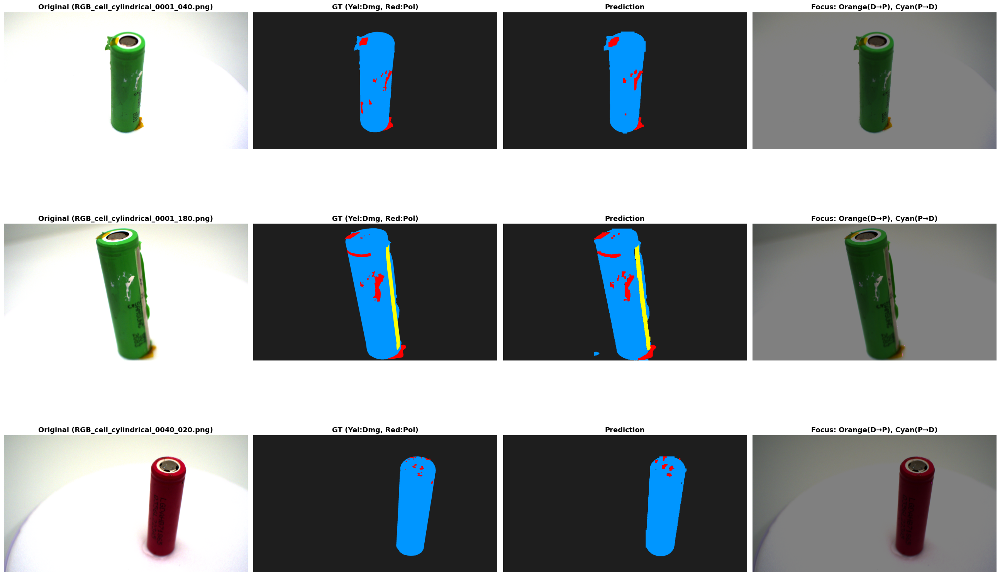

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

# ================= 1. 경로 설정 =================
MODEL_PATH = '/content/drive/MyDrive/battery_project/weights/best_sgd.pt'
VAL_IMG_DIR = '/content/yolo_dataset/val/images'
VAL_LBL_DIR = '/content/yolo_dataset/val/labels'

# --- 클래스 설정 (색상 동기화) ---
# 0: Battery(파랑), 1: Damaged(노랑), 2: Pollution(빨강)
CLASS_COLORS = {
    0: [0, 150, 255],  # Battery
    1: [255, 255, 0],  # Damaged
    2: [255, 0, 0],    # Pollution
    3: [30, 30, 30]    # Background (Dark)
}

# --- [핵심] 결함 혼동 분석용 색상 ---
# 파손과 오염 사이의 실수를 집중적으로 봅니다.
ERR_D_AS_P = [255, 165, 0]   # 파손인데 오염이라 함 (Damaged -> Pollution): 주황색
ERR_P_AS_D = [0, 255, 255]   # 오염인데 파손이라 함 (Pollution -> Damaged): 하늘색
ERR_GENERAL_FN = [150, 0, 150] # 기타 미탐 (결함인데 배경이라 함): 보라색

def analyze_defect_confusion(num_samples=4):
    model = YOLO(MODEL_PATH)
    img_files = sorted([f for f in os.listdir(VAL_IMG_DIR) if f.endswith(('.jpg', '.png'))])[:num_samples]

    fig, axes = plt.subplots(num_samples, 4, figsize=(26, 6 * num_samples))
    if num_samples == 1: axes = np.expand_dims(axes, axis=0)

    for i, f_name in enumerate(img_files):
        img_path = os.path.join(VAL_IMG_DIR, f_name)
        lbl_path = os.path.join(VAL_LBL_DIR, f_name.rsplit('.', 1)[0] + '.txt')

        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img_rgb.shape[:2]

        # GT 및 Pred 마스크 생성 (배경 3번)
        gt_mask = np.full((h, w), 3, dtype=np.uint8)
        pred_mask = np.full((h, w), 3, dtype=np.uint8)

        # [GT 보정] 인덱스 -1 적용 (1->0, 2->1, 3->2)
        if os.path.exists(lbl_path):
            with open(lbl_path, 'r') as f:
                for line in f:
                    p = list(map(float, line.strip().split()))
                    cls_id = int(p[0]) - 1
                    if 0 <= cls_id <= 2:
                        poly = (np.array(p[1:]).reshape(-1, 2) * [w, h]).astype(np.int32)
                        cv2.fillPoly(gt_mask, [poly], cls_id)

        # [Pred] 모델 예측
        res = model.predict(img_path, conf=0.25, imgsz=1024, verbose=False)[0]
        if res.masks:
            for m_data, b_data in zip(res.masks.data, res.boxes):
                cls_id = int(b_data.cls[0])
                m_resized = cv2.resize(m_data.cpu().numpy(), (w, h), interpolation=cv2.INTER_NEAREST)
                pred_mask[m_resized > 0.5] = cls_id

        # --- 시각화 데이터 구성 ---
        gt_disp = np.zeros_like(img_rgb)
        pred_disp = np.zeros_like(img_rgb)
        for c, color in CLASS_COLORS.items():
            gt_disp[gt_mask == c] = color
            pred_disp[pred_mask == c] = color

        # --- [집중 분석] 결함 혼동 맵 ---
        conf_map = np.zeros_like(img_rgb)

        # 1. 파손(1)을 오염(2)으로 착각 (D -> P) : 주황색
        d_as_p = (gt_mask == 1) & (pred_mask == 2)
        conf_map[d_as_p] = ERR_D_AS_P

        # 2. 오염(2)을 파손(1)으로 착각 (P -> D) : 하늘색
        p_as_d = (gt_mask == 2) & (pred_mask == 1)
        conf_map[p_as_d] = ERR_P_AS_D

        # 3. 결함(1,2)을 아예 못 찾음 (FN) : 보라색
        missed = ((gt_mask == 1) | (gt_mask == 2)) & (pred_mask == 3)
        conf_map[missed] = ERR_GENERAL_FN

        # 결과 오버레이 (원본에 섞기)
        conf_overlay = cv2.addWeighted(img_rgb, 0.5, conf_map, 0.5, 0)

        # --- 플롯 배치 ---
        imgs = [img_rgb, gt_disp, pred_disp, conf_overlay]
        titles = [
            f"Original ({f_name})",
            "GT (Yel:Dmg, Red:Pol)",
            "Prediction",
            "Focus: Orange(D→P), Cyan(P→D)"
        ]

        for j, (im, tt) in enumerate(zip(imgs, titles)):
            axes[i, j].imshow(im)
            axes[i, j].set_title(tt, fontsize=13, fontweight='bold')
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

# 실행
analyze_defect_confusion(num_samples=3)

🔍 전체 4450장 중 5장을 무작위로 선택하여 분석합니다.


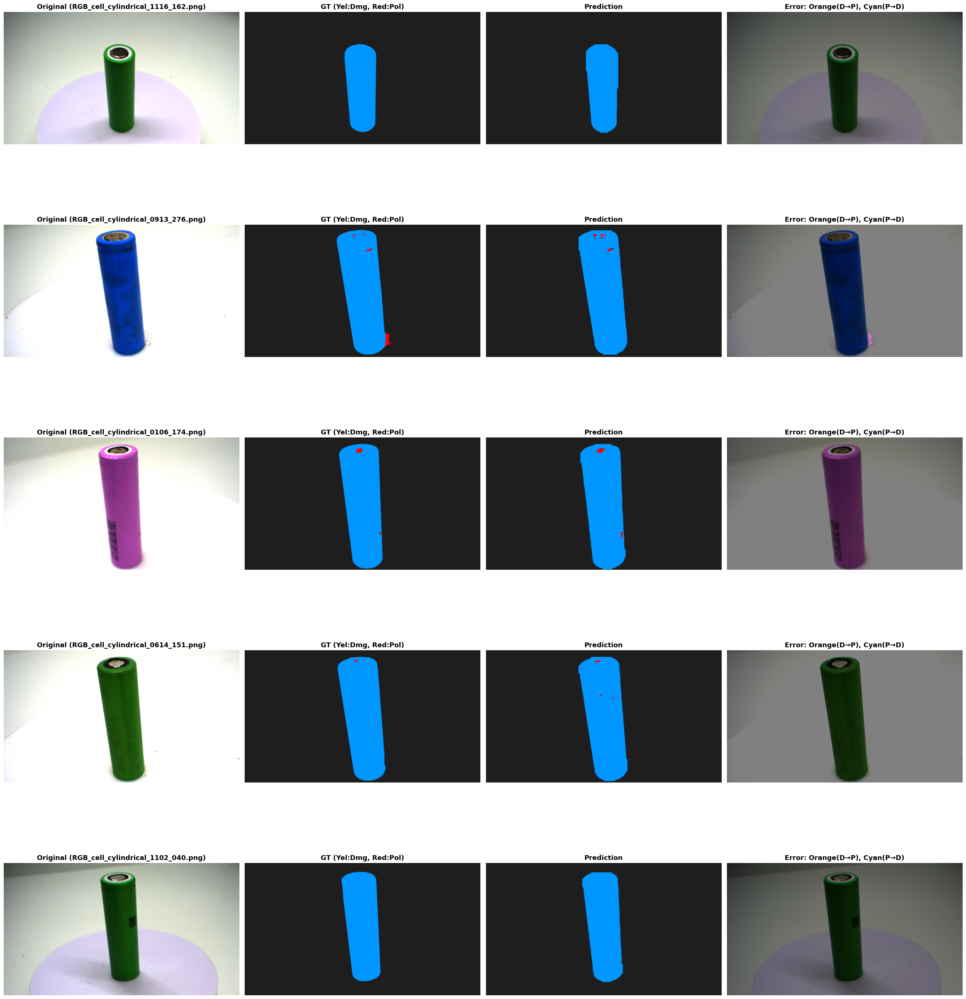

In [ ]:
import os
import cv2
import glob
import random
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

# ================= 1. 경로 설정 =================
MODEL_PATH = '/content/drive/MyDrive/battery_project/weights/best_sgd.pt'
VAL_IMG_DIR = '/content/yolo_dataset/val/images'
VAL_LBL_DIR = '/content/yolo_dataset/val/labels'

# --- 클래스 및 색상 설정 ---
# 0: Battery(파랑), 1: Damaged(노랑), 2: Pollution(빨강)
CLASS_COLORS = {
    0: [0, 150, 255],  # Battery
    1: [255, 255, 0],  # Damaged
    2: [255, 0, 0],    # Pollution
    3: [30, 30, 30]    # Background
}

# --- 결함 혼동 분석용 색상 ---
ERR_D_AS_P = [255, 165, 0]     # 파손인데 오염이라 함 (D -> P): 주황색
ERR_P_AS_D = [0, 255, 255]     # 오염인데 파손이라 함 (P -> D): 하늘색
ERR_GENERAL_FN = [150, 0, 150]   # 결함인데 배경이라 함 (Miss): 보라색

def visualize_diverse_confusion(num_samples=5):
    if not os.path.exists(MODEL_PATH):
        print("❌ 모델 파일을 찾을 수 없습니다.")
        return

    model = YOLO(MODEL_PATH)

    # 전체 이미지 목록 가져오기
    all_images = glob.glob(os.path.join(VAL_IMG_DIR, '*.jpg')) + \
                 glob.glob(os.path.join(VAL_IMG_DIR, '*.png'))

    if not all_images:
        print("⚠️ 이미지를 찾을 수 없습니다.")
        return

    # [핵심] 무작위로 이미지 선택
    selected_images = random.sample(all_images, min(num_samples, len(all_images)))
    print(f"🔍 전체 {len(all_images)}장 중 {len(selected_images)}장을 무작위로 선택하여 분석합니다.")

    fig, axes = plt.subplots(len(selected_images), 4, figsize=(26, 6 * len(selected_images)))
    if len(selected_images) == 1: axes = np.expand_dims(axes, axis=0)

    for i, img_path in enumerate(selected_images):
        f_name = os.path.basename(img_path)
        lbl_path = os.path.join(VAL_LBL_DIR, f_name.rsplit('.', 1)[0] + '.txt')

        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img_rgb.shape[:2]

        # GT 및 Pred 마스크 생성
        gt_mask = np.full((h, w), 3, dtype=np.uint8)
        pred_mask = np.full((h, w), 3, dtype=np.uint8)

        # [GT 보정] 인덱스 -1 적용
        if os.path.exists(lbl_path):
            with open(lbl_path, 'r') as f:
                for line in f:
                    p = list(map(float, line.strip().split()))
                    cls_id = int(p[0]) - 1
                    if 0 <= cls_id <= 2:
                        poly = (np.array(p[1:]).reshape(-1, 2) * [w, h]).astype(np.int32)
                        cv2.fillPoly(gt_mask, [poly], cls_id)

        # [Pred] 모델 예측
        res = model.predict(img_path, conf=0.25, imgsz=1024, verbose=False)[0]
        if res.masks:
            for m_data, b_data in zip(res.masks.data, res.boxes):
                cls_id = int(b_data.cls[0])
                m_resized = cv2.resize(m_data.cpu().numpy(), (w, h), interpolation=cv2.INTER_NEAREST)
                pred_mask[m_resized > 0.5] = cls_id

        # 시각화용 변환
        gt_disp = np.zeros_like(img_rgb)
        pred_disp = np.zeros_like(img_rgb)
        for c, color in CLASS_COLORS.items():
            gt_disp[gt_mask == c] = color
            pred_disp[pred_mask == c] = color

        # 결함 혼동 맵 생성
        conf_map = np.zeros_like(img_rgb)
        conf_map[(gt_mask == 1) & (pred_mask == 2)] = ERR_D_AS_P  # D->P (주황)
        conf_map[(gt_mask == 2) & (pred_mask == 1)] = ERR_P_AS_D  # P->D (하늘)
        conf_map[((gt_mask == 1) | (gt_mask == 2)) & (pred_mask == 3)] = ERR_GENERAL_FN # Miss (보라)

        conf_overlay = cv2.addWeighted(img_rgb, 0.5, conf_map, 0.5, 0)

        # 결과 배치
        imgs = [img_rgb, gt_disp, pred_disp, conf_overlay]
        titles = [f"Original ({f_name})", "GT (Yel:Dmg, Red:Pol)", "Prediction", "Error: Orange(D→P), Cyan(P→D)"]

        for j, (im, tt) in enumerate(zip(imgs, titles)):
            axes[i, j].imshow(im)
            axes[i, j].set_title(tt, fontsize=13, fontweight='bold')
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

# 실행 (한 번에 볼 이미지 개수 설정)
visualize_diverse_confusion(num_samples=5)

🔍 전체 4450장 중 5장을 무작위로 선택하여 시각화합니다.


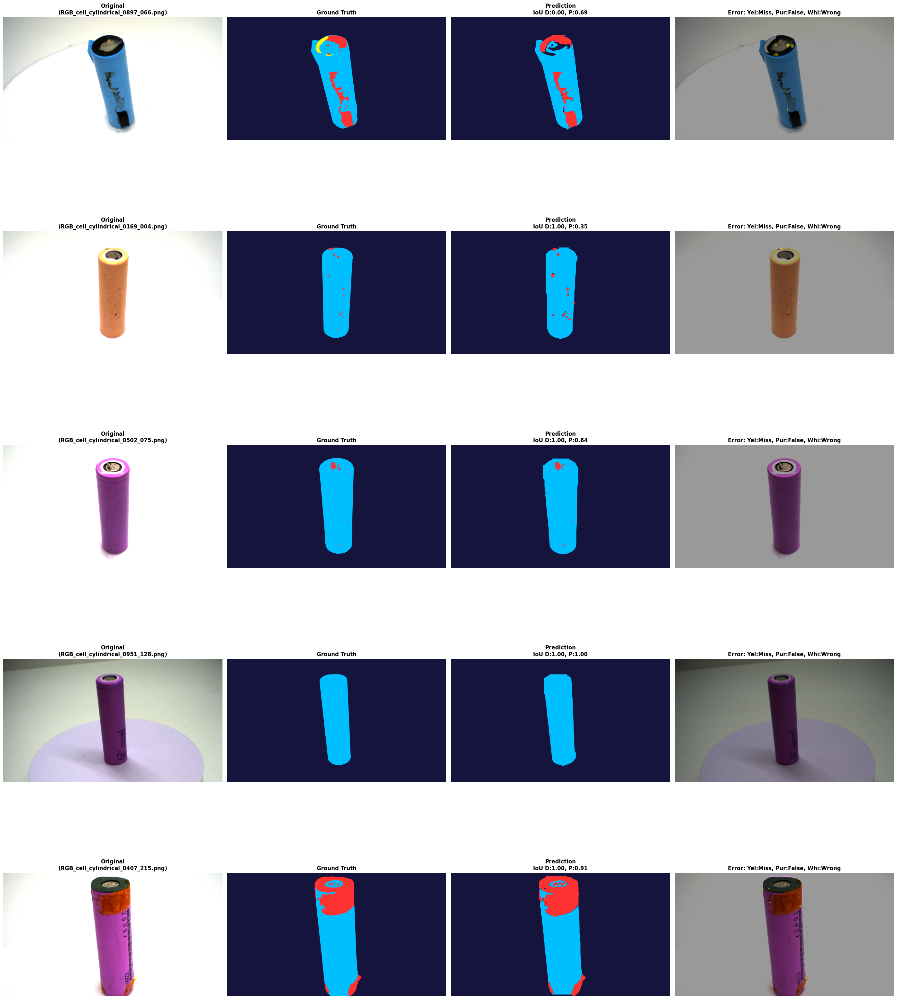

In [ ]:
import os
import cv2
import glob
import random
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

# ================= 1. 경로 설정 =================
MODEL_PATH = '/content/drive/MyDrive/battery_project/weights/best_sgd.pt'
VAL_IMG_DIR = '/content/yolo_dataset/val/images'
VAL_LBL_DIR = '/content/yolo_dataset/val/labels'

# 클래스 색상 (0: Battery-하늘색, 1: Damaged-노란색, 2: Pollution-빨간색, 3: Background-남색)
CLASS_COLORS = {
    0: [0, 191, 255],
    1: [255, 255, 0],
    2: [255, 50, 50],
    3: [20, 20, 60]
}

# 에러 분석용 색상
ERR_COLORS = {
    'MISS': [255, 255, 0],   # 미탐 (결함인데 못찾음) -> 노랑
    'FALSE': [255, 0, 255],  # 과검 (배경인데 결함이라함) -> 자주
    'WRONG': [255, 255, 255] # 오분류 (종류 헷갈림) -> 흰색
}

def calculate_iou(mask1, mask2):
    intersection = np.logical_and(mask1, mask2).sum()
    union = np.logical_or(mask1, mask2).sum()
    if union == 0: return 1.0
    return intersection / union

def visualize_diverse_analysis(num_samples=5):
    if not os.path.exists(MODEL_PATH):
        print("❌ 모델 파일을 찾을 수 없습니다.")
        return

    model = YOLO(MODEL_PATH)

    # 전체 이미지 목록 가져오기 (jpg, png 모두 포함)
    all_images = glob.glob(os.path.join(VAL_IMG_DIR, '*.jpg')) + \
                 glob.glob(os.path.join(VAL_IMG_DIR, '*.png'))

    if not all_images:
        print("⚠️ 이미지를 찾을 수 없습니다. 경로를 확인하세요.")
        return

    # [핵심] 실행할 때마다 무작위로 이미지 선택
    selected_images = random.sample(all_images, min(num_samples, len(all_images)))
    print(f"🔍 전체 {len(all_images)}장 중 {len(selected_images)}장을 무작위로 선택하여 시각화합니다.")

    fig, axes = plt.subplots(len(selected_images), 4, figsize=(28, 7 * len(selected_images)))
    if len(selected_images) == 1: axes = np.expand_dims(axes, axis=0)

    for i, img_path in enumerate(selected_images):
        f_name = os.path.basename(img_path)
        lbl_path = os.path.join(VAL_LBL_DIR, f_name.rsplit('.', 1)[0] + '.txt')

        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img_rgb.shape[:2]

        # --- [A] GT 마스크 생성 (인덱스 보정 -1 적용) ---
        gt_mask = np.full((h, w), 3, dtype=np.uint8)
        if os.path.exists(lbl_path):
            with open(lbl_path, 'r') as f:
                for line in f:
                    p = list(map(float, line.strip().split()))
                    cls_id = int(p[0]) - 1
                    if 0 <= cls_id <= 2:
                        poly = (np.array(p[1:]).reshape(-1, 2) * [w, h]).astype(np.int32)
                        cv2.fillPoly(gt_mask, [poly], cls_id)

        # --- [B] 예측 마스크 생성 ---
        res = model.predict(img_path, conf=0.25, imgsz=1024, verbose=False)[0]
        pred_mask = np.full((h, w), 3, dtype=np.uint8)
        if res.masks:
            for m_data, b_data in zip(res.masks.data, res.boxes):
                cls_id = int(b_data.cls[0])
                m_resized = cv2.resize(m_data.cpu().numpy(), (w, h), interpolation=cv2.INTER_NEAREST)
                pred_mask[m_resized > 0.5] = cls_id

        # --- [C] IoU 계산 ---
        iou_d = calculate_iou(gt_mask == 1, pred_mask == 1)
        iou_p = calculate_iou(gt_mask == 2, pred_mask == 2)

        # 시각화용 변환
        gt_disp = np.zeros_like(img_rgb)
        pred_disp = np.zeros_like(img_rgb)
        for c, color in CLASS_COLORS.items():
            gt_disp[gt_mask == c] = color
            pred_disp[pred_mask == c] = color

        # --- [D] 에러 맵 생성 (틀린 부분 강조) ---
        error_map = np.zeros_like(img_rgb)
        # 미탐 (노랑)
        error_map[((gt_mask == 1) | (gt_mask == 2)) & (pred_mask == 3)] = ERR_COLORS['MISS']
        # 과검 (자주)
        error_map[(gt_mask == 3) & ((pred_mask == 1) | (pred_mask == 2))] = ERR_COLORS['FALSE']
        # 오분류 (흰색: 결함 종류를 헷갈림)
        error_map[((gt_mask == 1) | (gt_mask == 2)) & ((pred_mask == 1) | (pred_mask == 2)) & (gt_mask != pred_mask)] = ERR_COLORS['WRONG']

        error_overlay = cv2.addWeighted(img_rgb, 0.6, error_map, 0.4, 0)

        # --- [E] 결과 출력 ---
        titles = [
            f"Original\n({f_name})",
            "Ground Truth",
            f"Prediction\nIoU D:{iou_d:.2f}, P:{iou_p:.2f}",
            "Error: Yel:Miss, Pur:False, Whi:Wrong"
        ]
        imgs = [img_rgb, gt_disp, pred_disp, error_overlay]

        for j, (im, tt) in enumerate(zip(imgs, titles)):
            axes[i, j].imshow(im)
            axes[i, j].set_title(tt, fontsize=12, fontweight='bold')
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

# 실행 (한 번에 볼 이미지 개수 설정 가능)
visualize_diverse_analysis(num_samples=5)

In [ ]:
# SAM ViT-H 가중치 다운로드 (약 2.5GB)
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

--2026-01-22 02:15:56--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 65.8.54.85, 65.8.54.33, 65.8.54.65, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|65.8.54.85|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   260MB/s    in 10s     

2026-01-22 02:16:07 (235 MB/s) - ‘sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]



In [ ]:
# 1. 필수 라이브러리 설치 (가장 먼저 실행됩니다)
print("📦 라이브러리 설치 중...")
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install ultralytics

# 2. SAM 가중치 파일 다운로드 (약 2.5GB, 이미 있으면 건너뜁니다)
import os
if not os.path.exists("/content/sam_vit_h_4b8939.pth"):
    print("📥 SAM 가중치 파일 다운로드 중 (약 2.5GB)...")
    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
else:
    print("✅ SAM 가중치 파일이 이미 존재합니다.")

import cv2
import glob
import numpy as np
import torch
from tqdm import tqdm
from google.colab import drive
from ultralytics import YOLO
from segment_anything import sam_model_registry, SamPredictor

# ==================================================================================
# [A] 설정 및 경로 지정
# ==================================================================================

# 1. 드라이브 마운트
print("📂 구글 드라이브 연결 중...")
drive.mount('/content/drive')

# 2. 경로 설정 (사용자 환경에 맞게 수정)
YOLO_MODEL_PATH = '/content/drive/MyDrive/battery_project/weights/best_sgd.pt'
SAM_CHECKPOINT_PATH = "/content/sam_vit_h_4b8939.pth"
SAM_MODEL_TYPE = "vit_h"

VAL_IMG_DIR = '/content/yolo_dataset/val/images'
SAVE_DRIVE_DIR = '/content/drive/MyDrive/battery_project/refined_masks_final'
os.makedirs(SAVE_DRIVE_DIR, exist_ok=True)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
BACKGROUND_ID = 3

# ==================================================================================
# [B] 모델 로드 및 함수 정의
# ==================================================================================

print(f"🚀 모델 로드 중... (Device: {DEVICE})")
yolo_model = YOLO(YOLO_MODEL_PATH)
sam = sam_model_registry[SAM_MODEL_TYPE](checkpoint=SAM_CHECKPOINT_PATH)
sam.to(device=DEVICE)
sam_predictor = SamPredictor(sam)

def get_centroid(mask):
    """마스크의 무게 중심점 좌표 추출 (Point Prompt)"""
    M = cv2.moments(mask.astype(np.uint8))
    if M["m00"] == 0: return None
    return np.array([[int(M["m10"] / M["m00"]), int(M["m01"] / M["m00"])]])

# ==================================================================================
# [C] 메인 프로세스 실행
# ==================================================================================

def run_refinement():
    img_files = glob.glob(os.path.join(VAL_IMG_DIR, '*.jpg')) + \
                glob.glob(os.path.join(VAL_IMG_DIR, '*.png'))

    print(f"▶️ 총 {len(img_files)}장의 이미지 처리를 시작합니다.")

    for img_path in tqdm(img_files, desc="Processing"):
        f_name = os.path.basename(img_path)
        save_path = os.path.join(SAVE_DRIVE_DIR, f_name.rsplit('.', 1)[0] + '.png')

        image_bgr = cv2.imread(img_path)
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        h, w = image_rgb.shape[:2]

        final_canvas = np.full((h, w), BACKGROUND_ID, dtype=np.uint8)
        results = yolo_model.predict(img_path, conf=0.25, imgsz=1024, verbose=False)[0]

        if results.masks is not None:
            sam_predictor.set_image(image_rgb)
            for m_data, b_data in zip(results.masks.data, results.boxes):
                cls_id = int(b_data.cls[0])
                box = b_data.xyxy[0].cpu().numpy() # [x1, y1, x2, y2]

                yolo_mask = cv2.resize(m_data.cpu().numpy(), (w, h), interpolation=cv2.INTER_NEAREST)
                input_point = get_centroid(yolo_mask)

                if input_point is not None:
                    # ⭐ 박스(Box)와 포인트(Point)를 동시에 전달하여 마스크 깎기
                    masks, _, _ = sam_predictor.predict(
                        point_coords=input_point,
                        point_labels=np.array([1]),
                        box=box,
                        multimask_output=False
                    )
                    final_canvas[masks[0]] = cls_id
                else:
                    final_canvas[yolo_mask > 0.5] = cls_id

        # 드라이브에 저장
        cv2.imwrite(save_path, final_canvas)

    print(f"\n✨ 완료! 결과 폴더: {SAVE_DRIVE_DIR}")

if __name__ == "__main__":
    run_refinement()

📦 라이브러리 설치 중...
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-054ddrz4
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-054ddrz4
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=cc5757216fabcf9684feedbf39b24c2e4623ead57758fc7ce36a2e3ed7fa10ac
  Stored in directory: /tmp/pip-ephem-wheel-cache-ldkpq5g0/wheels/29/82/ff/04e2be9805a1cb48bec0b85b5a6da6b63f647645750a0e42d4
Successfully built segment_anything
✅ SAM 가중치 파일이 이미 존재합니다.
📂 구글 드라이브 연결 중...
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
🚀 모델 로드 중... (Device: cuda)
▶️ 총 4450장의 이미지 처리를 시작합니다.


Processing:   0%|          | 11/4450 [00:12<1:26:02,  1.16s/it]
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.


KeyboardInterrupt



In [ ]:
import os
import cv2
import glob
import numpy as np
import torch
from tqdm import tqdm # 진행률 표시 바
from google.colab import drive # 구글 드라이브 마운트
from ultralytics import YOLO
# segment_anything 라이브러리가 설치되어 있어야 합니다.
# !pip install segment-anything
from segment_anything import sam_model_registry, SamPredictor

# ==================================================================================
# [1] 설정 및 경로 지정 (환경에 맞게 꼭 확인해주세요)
# ==================================================================================

# 1-1. 드라이브 마운트
print("📂 구글 드라이브를 연결합니다...")
drive.mount('/content/drive')

# 1-2. 모델 경로
# 학습된 YOLO 가중치 경로
YOLO_MODEL_PATH = '/content/drive/MyDrive/battery_project/weights/best_sgd.pt'
# 다운로드 받은 SAM 가중치 경로 (로컬 경로)
SAM_CHECKPOINT_PATH = "/content/sam_vit_h_4b8939.pth"
SAM_MODEL_TYPE = "vit_h" # 가장 큰 모델 사용

# 1-3. 데이터 경로
# 원본 이미지가 있는 폴더
VAL_IMG_DIR = '/content/yolo_dataset/val/images'

# ⭐ [중요] 정제된 마스크가 저장될 구글 드라이브 경로
# 기존 폴더와 섞이지 않게 새 이름을 지정했습니다.
SAVE_DRIVE_DIR = '/content/drive/MyDrive/battery_project/refined_masks_boxpoint_final'
os.makedirs(SAVE_DRIVE_DIR, exist_ok=True) # 폴더가 없으면 생성

# 1-4. 기타 설정
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"✅ 설정 완료. 사용 디바이스: {DEVICE}")
print(f"📂 결과 저장 경로: {SAVE_DRIVE_DIR}")

# 배경 클래스 ID (이 값으로 빈 공간을 채웁니다)
BACKGROUND_CLASS_ID = 3


# ==================================================================================
# [2] 모델 로드 및 헬퍼 함수 정의
# ==================================================================================

print("\n🚀 모델 로드 중... (SAM 모델이 커서 시간이 조금 걸립니다)")
# YOLO 로드
yolo_model = YOLO(YOLO_MODEL_PATH)

# SAM 로드 및 GPU 이동
if not os.path.exists(SAM_CHECKPOINT_PATH):
    raise FileNotFoundError(f"❌ SAM 가중치 파일이 없습니다: {SAM_CHECKPOINT_PATH}. 먼저 다운로드해주세요!")
sam = sam_model_registry[SAM_MODEL_TYPE](checkpoint=SAM_CHECKPOINT_PATH)
sam.to(device=DEVICE)
sam_predictor = SamPredictor(sam)
print("✅ 모든 모델 로드 완료!")

def get_centroid(mask):
    """마스크(이진 이미지)의 무게 중심점 좌표를 반환합니다."""
    M = cv2.moments(mask.astype(np.uint8))
    # 마스크 영역이 없어서 분모가 0이 되는 경우 방지
    if M["m00"] == 0: return None
    cX = int(M["m10"] / M["m00"])
    cY = int(M["m01"] / M["m00"])
    # SAM 입력 형식에 맞춰 반환: [[x, y]]
    return np.array([[cX, cY]])


# ==================================================================================
# [3] 메인 프로세싱 루프 (YOLO -> SAM -> 드라이브 저장)
# ==================================================================================

def run_full_refinement_pipeline():
    # 처리할 이미지 리스트업
    img_files = glob.glob(os.path.join(VAL_IMG_DIR, '*.jpg')) + \
                glob.glob(os.path.join(VAL_IMG_DIR, '*.png'))

    print(f"\n▶️ 총 {len(img_files)}장의 이미지에 대해 정제 작업을 시작합니다.")

    # tqdm으로 진행률 표시
    for img_path in tqdm(img_files, desc="Processing & Saving to Drive"):
        # --- A. 이미지 및 캔버스 준비 ---
        f_name = os.path.basename(img_path)
        # 저장될 파일명: 확장자를 .png로 변경 (마스크 저장은 png가 국룰)
        save_path = os.path.join(SAVE_DRIVE_DIR, f_name.rsplit('.', 1)[0] + '.png')

        image_bgr = cv2.imread(img_path)
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        h, w = image_rgb.shape[:2]

        # 최종 마스크를 그릴 캔버스 생성 (초기값은 모두 배경 클래스 3)
        final_mask_canvas = np.full((h, w), BACKGROUND_CLASS_ID, dtype=np.uint8)

        # --- B. YOLO 1차 추론 ---
        # 작은 결함을 위해 고해상도(1024) 사용
        results = yolo_model.predict(img_path, conf=0.25, imgsz=1024, verbose=False)[0]

        # 탐지된 객체가 있을 경우에만 SAM 프로세스 진행
        if results.masks is not None:
            # SAM 이미지 인코딩 (이미지당 1회만 수행)
            sam_predictor.set_image(image_rgb)

            # 각 객체별로 반복
            for m_data, b_data in zip(results.masks.data, results.boxes):
                cls_id = int(b_data.cls[0]) # 클래스 ID

                # 1. YOLO에서 박스(Box) 정보 추출
                box = b_data.xyxy[0].cpu().numpy()

                # 2. YOLO 마스크에서 중심점(Point) 정보 추출
                # 원본 크기로 리사이즈
                yolo_raw_mask = cv2.resize(m_data.cpu().numpy(), (w, h), interpolation=cv2.INTER_NEAREST)
                input_point = get_centroid(yolo_raw_mask)
                input_label = np.array([1]) # 1은 전경(Foreground) 포인트라는 의미

                refined_mask = None
                if input_point is not None:
                    # ⭐ [핵심] SAM 추론: Box 프롬프트 + Point 프롬프트 동시 사용
                    masks, _, _ = sam_predictor.predict(
                        point_coords=input_point,
                        point_labels=input_label,
                        box=box,
                        multimask_output=False # 가장 점수 높은 단일 마스크 선택
                    )
                    refined_mask = masks[0]
                else:
                    # 만약 중심점 추출에 실패하면 아쉽지만 YOLO 마스크 사용
                    refined_mask = yolo_raw_mask > 0.5

                # C. 최종 캔버스에 정제된 마스크 그리기
                # refined_mask가 True인 위치에 현재 클래스 ID 값을 채움
                final_mask_canvas[refined_mask] = cls_id

        # --- D. 드라이브에 최종 마스크 저장 ---
        # 픽셀 값이 클래스 ID(0,1,2,3)인 PNG 파일로 저장됨
        cv2.imwrite(save_path, final_mask_canvas)

    print(f"\n✨ 모든 작업 완료!")
    print(f"파일이 저장된 구글 드라이브 경로를 확인하세요: {SAVE_DRIVE_DIR}")

# 실행 명령
if __name__ == "__main__":
    run_full_refinement_pipeline()

📂 구글 드라이브를 연결합니다...
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ 설정 완료. 사용 디바이스: cuda
📂 결과 저장 경로: /content/drive/MyDrive/battery_project/refined_masks_boxpoint_final

🚀 모델 로드 중... (SAM 모델이 커서 시간이 조금 걸립니다)
✅ 모든 모델 로드 완료!

▶️ 총 4450장의 이미지에 대해 정제 작업을 시작합니다.


Processing & Saving to Drive: 100%|██████████| 4450/4450 [1:30:10<00:00,  1.22s/it]


✨ 모든 작업 완료!
파일이 저장된 구글 드라이브 경로를 확인하세요: /content/drive/MyDrive/battery_project/refined_masks_boxpoint_final


In [ ]:
import os
import cv2
import glob
import numpy as np
import pandas as pd
from tqdm import tqdm

# ================= 1. 경로 설정 =================
# 정제된 마스크가 저장된 드라이브 경로 (이전 코드의 저장 경로와 일치해야 함)
REFINED_MASK_DIR = '/content/drive/MyDrive/battery_project/refined_masks_final'
# 실제 정답(GT) 라벨이 있는 폴더 (TXT 파일)
VAL_LBL_DIR = '/content/yolo_dataset/val/labels'
# 이미지 크기 확인을 위한 폴더 (이미지 파일)
VAL_IMG_DIR = '/content/yolo_dataset/val/images'

# 클래스 정의 (0: Battery, 1: Damaged, 2: Pollution, 3: Background)
CLASS_NAMES = {0: 'Battery', 1: 'Damaged', 2: 'Pollution'}

def calculate_iou_metrics():
    # 결과 저장을 위한 누적 변수
    # 각 클래스별로 [Intersection 합계, Union 합계] 저장
    metrics = {i: [0, 0] for i in range(4)} # 0, 1, 2: 객체, 3: 배경

    mask_files = glob.glob(os.path.join(REFINED_MASK_DIR, '*.png'))
    print(f"🧐 총 {len(mask_files)}개의 정제된 마스크를 평가합니다...")

    for mask_path in tqdm(mask_files, desc="Evaluating"):
        f_name = os.path.basename(mask_path)
        base_name = f_name.rsplit('.', 1)[0]

        # 1. SAM으로 정제한 마스크 로드 (Prediction)
        pred_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        h, w = pred_mask.shape

        # 2. GT 라벨 로드 및 픽셀 마스크로 변환
        gt_mask = np.full((h, w), 3, dtype=np.uint8) # 기본 배경 3
        lbl_path = os.path.join(VAL_LBL_DIR, base_name + '.txt')

        if os.path.exists(lbl_path):
            with open(lbl_path, 'r') as f:
                for line in f:
                    p = list(map(float, line.strip().split()))
                    # GT 인덱스 보정 (1,2,3 -> 0,1,2)
                    cls_id = int(p[0]) - 1
                    if 0 <= cls_id <= 2:
                        poly = (np.array(p[1:]).reshape(-1, 2) * [w, h]).astype(np.int32)
                        cv2.fillPoly(gt_mask, [poly], cls_id)

        # 3. 클래스별 Intersection 및 Union 계산
        for cls_id in range(4):
            gt_cls = (gt_mask == cls_id)
            pred_cls = (pred_mask == cls_id)

            intersection = np.logical_and(gt_cls, pred_cls).sum()
            union = np.logical_or(gt_cls, pred_cls).sum()

            metrics[cls_id][0] += intersection
            metrics[cls_id][1] += union

    # 4. 최종 결과 요약
    results = []
    total_iou = 0
    count_classes = 0

    print("\n" + "="*50)
    print(f"{'Class Name':<15} | {'IoU (%)':<10}")
    print("-"*50)

    for cls_id in range(4):
        intersection_sum, union_sum = metrics[cls_id]

        if union_sum == 0:
            iou = 100.0 if intersection_sum == 0 else 0.0
        else:
            iou = (intersection_sum / union_sum) * 100

        name = CLASS_NAMES.get(cls_id, "Background")
        results.append({"Class": name, "IoU": round(iou, 2)})
        print(f"{name:<15} | {iou:>8.2f}%")

        # mIoU 계산 (배경을 제외한 결함 클래스들만 평균낼지 선택 가능)
        if cls_id < 3: # Battery, Damaged, Pollution만 포함
            total_iou += iou
            count_classes += 1

    miou = total_iou / count_classes if count_classes > 0 else 0
    print("-"*50)
    print(f"{'mIoU (Mean)':<15} | {miou:>8.2f}%")
    print("="*50)

    return pd.DataFrame(results)

# 실행
df_results = calculate_iou_metrics()

🧐 총 11개의 정제된 마스크를 평가합니다...


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 37.33it/s]


Class Name      | IoU (%)   
--------------------------------------------------
Battery         |    97.48%
Damaged         |     0.00%
Pollution       |    79.17%
Background      |    99.80%
--------------------------------------------------
mIoU (Mean)     |    58.88%


In [ ]:
import os
import cv2
import numpy as np

# 경로 설정 (사용자님 경로에 맞춰 확인)
REFINED_MASK_DIR = '/content/drive/MyDrive/battery_project/refined_masks_final'
VAL_LBL_DIR = '/content/yolo_dataset/val/labels'

mask_files = [f for f in os.listdir(REFINED_MASK_DIR) if f.endswith('.png')]

print("📊 [진단 결과] 11장의 사진 데이터 확인")
print("-" * 50)

for f_name in mask_files:
    # 1. 저장된 예측 PNG 확인
    pred_path = os.path.join(REFINED_MASK_DIR, f_name)
    pred_mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)

    # 2. GT 라벨 파일 확인
    lbl_path = os.path.join(VAL_LBL_DIR, f_name.replace('.png', '.txt'))

    pred_counts = {i: np.sum(pred_mask == i) for i in range(4)}

    gt_damaged_exists = False
    if os.path.exists(lbl_path):
        with open(lbl_path, 'r') as f:
            lines = f.readlines()
            # GT에서 2번(보정후 1번)이 있는지 확인
            gt_damaged_exists = any(int(line.split()[0]) == 2 for line in lines)

    print(f"파일명: {f_name}")
    print(f"  - 예측 PNG에 포함된 Damaged(1번) 픽셀 수: {pred_counts[1]}")
    print(f"  - GT 라벨에 Damaged(2번) 존재 여부: {'✅ 있음' if gt_damaged_exists else '❌ 없음'}")

    if gt_damaged_exists and pred_counts[1] == 0:
        print("  ⚠️ 경고: 정답에는 파손이 있는데 모델이 하나도 못 찾았습니다 (미탐)")
    elif not gt_damaged_exists and pred_counts[1] > 0:
        print("  ⚠️ 경고: 정답에는 파손이 없는데 모델이 파손이라고 예측했습니다 (과검)")
    print("-" * 30)

📊 [진단 결과] 11장의 사진 데이터 확인
--------------------------------------------------
파일명: RGB_cell_cylindrical_0672_281.png
  - 예측 PNG에 포함된 Damaged(1번) 픽셀 수: 0
  - GT 라벨에 Damaged(2번) 존재 여부: ❌ 없음
------------------------------
파일명: RGB_cell_cylindrical_0563_143.png
  - 예측 PNG에 포함된 Damaged(1번) 픽셀 수: 0
  - GT 라벨에 Damaged(2번) 존재 여부: ✅ 있음
  ⚠️ 경고: 정답에는 파손이 있는데 모델이 하나도 못 찾았습니다 (미탐)
------------------------------
파일명: RGB_cell_cylindrical_0954_212.png
  - 예측 PNG에 포함된 Damaged(1번) 픽셀 수: 0
  - GT 라벨에 Damaged(2번) 존재 여부: ❌ 없음
------------------------------
파일명: RGB_cell_cylindrical_1083_067.png
  - 예측 PNG에 포함된 Damaged(1번) 픽셀 수: 0
  - GT 라벨에 Damaged(2번) 존재 여부: ❌ 없음
------------------------------
파일명: RGB_cell_cylindrical_0823_081.png
  - 예측 PNG에 포함된 Damaged(1번) 픽셀 수: 0
  - GT 라벨에 Damaged(2번) 존재 여부: ❌ 없음
------------------------------
파일명: RGB_cell_cylindrical_1100_254.png
  - 예측 PNG에 포함된 Damaged(1번) 픽셀 수: 0
  - GT 라벨에 Damaged(2번) 존재 여부: ❌ 없음
------------------------------
파일명: RGB_cell_cylindrical_0429_178.

In [ ]:
import os
import cv2
import glob
import numpy as np
import torch
from tqdm import tqdm
from google.colab import drive
from ultralytics import YOLO
from segment_anything import sam_model_registry, SamPredictor

# 1. 초기 설정
drive.mount('/content/drive')
YOLO_MODEL_PATH = '/content/drive/MyDrive/battery_project/weights/best_sgd.pt'
SAM_CHECKPOINT_PATH = "/content/sam_vit_h_4b8939.pth"
VAL_IMG_DIR = '/content/yolo_dataset/val/images'
SAVE_DRIVE_DIR = '/content/drive/MyDrive/battery_project/refined_masks_v2' # 경로 변경 권장
os.makedirs(SAVE_DRIVE_DIR, exist_ok=True)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# 2. 모델 로드
yolo_model = YOLO(YOLO_MODEL_PATH)
sam = sam_model_registry["vit_h"](checkpoint=SAM_CHECKPOINT_PATH)
sam.to(device=DEVICE)
sam_predictor = SamPredictor(sam)

def get_centroid(mask):
    M = cv2.moments(mask.astype(np.uint8))
    if M["m00"] == 0: return None
    return np.array([[int(M["m10"] / M["m00"]), int(M["m01"] / M["m00"])]])

def run_safe_refinement():
    img_files = glob.glob(os.path.join(VAL_IMG_DIR, '*.jpg')) + \
                glob.glob(os.path.join(VAL_IMG_DIR, '*.png'))

    for img_path in tqdm(img_files, desc="Refining"):
        f_name = os.path.basename(img_path)
        save_path = os.path.join(SAVE_DRIVE_DIR, f_name.rsplit('.', 1)[0] + '.png')

        image_bgr = cv2.imread(img_path)
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        h, w = image_rgb.shape[:2]

        # 배경 3번으로 초기화
        final_canvas = np.full((h, w), 3, dtype=np.uint8)

        # ⭐ conf 값을 0.15로 낮춰서 더 민감하게 탐지
        results = yolo_model.predict(img_path, conf=0.15, imgsz=1024, verbose=False)[0]

        if results.masks is not None:
            sam_predictor.set_image(image_rgb)
            for m_data, b_data in zip(results.masks.data, results.boxes):
                cls_id = int(b_data.cls[0])
                box = b_data.xyxy[0].cpu().numpy()

                # YOLO가 찾은 기본 마스크
                yolo_mask = cv2.resize(m_data.cpu().numpy(), (w, h), interpolation=cv2.INTER_NEAREST)

                # SAM 정제 시도
                input_point = get_centroid(yolo_mask)
                success_sam = False

                if input_point is not None:
                    try:
                        masks, scores, _ = sam_predictor.predict(
                            point_coords=input_point,
                            point_labels=np.array([1]),
                            box=box,
                            multimask_output=False
                        )
                        # SAM 결과가 너무 작거나 이상하지 않은지 확인 (임계점 0.8 이상일 때만 채택)
                        if scores[0] > 0.8:
                            final_canvas[masks[0]] = cls_id
                            success_sam = True
                    except:
                        pass

                # ⭐ SAM이 실패했거나 결과가 부실하면 YOLO 마스크를 그대로 사용 (데이터 유실 방지)
                if not success_sam:
                    final_canvas[yolo_mask > 0.5] = cls_id

        cv2.imwrite(save_path, final_canvas)

run_safe_refinement()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Refining:   3%|▎         | 140/4450 [02:48<1:26:38,  1.21s/it]


KeyboardInterrupt: 

In [ ]:
import os
import cv2
import numpy as np
from ultralytics import YOLO

# 경로 설정
MODEL_PATH = '/content/drive/MyDrive/battery_project/weights/best_sgd.pt'
VAL_LBL_DIR = '/content/yolo_dataset/val/labels'

def check_model_and_label_sync():
    # 1. 모델 내부 클래스 이름 및 번호 확인
    if not os.path.exists(MODEL_PATH):
        print("❌ 모델 파일을 찾을 수 없습니다. 경로를 확인해주세요.")
        return

    model = YOLO(MODEL_PATH)
    print("="*50)
    print("1️⃣ 모델(Model)이 알고 있는 클래스 정보")
    print("="*50)
    for idx, name in model.names.items():
        print(f"Index {idx}: {name}")
    print("="*50)

    # 2. 실제 라벨 파일(TXT)의 데이터 분포 확인
    print("\n2️⃣ 실제 라벨 파일(GT) 내부 인덱스 분포 조사")
    print("="*50)
    label_files = [f for f in os.listdir(VAL_LBL_DIR) if f.endswith('.txt')]

    total_counts = {}
    for lbl_f in label_files:
        path = os.path.join(VAL_LBL_DIR, lbl_f)
        with open(path, 'r') as f:
            for line in f:
                cls_id = int(line.split()[0])
                total_counts[cls_id] = total_counts.get(cls_id, 0) + 1

    for cls_id in sorted(total_counts.keys()):
        print(f"Label File Index {cls_id}: 총 {total_counts[cls_id]}개 존재")
    print("="*50)

    # 3. 결론 도출을 위한 팁
    print("\n💡 [판독 가이드]")
    print("- 만약 모델 Index 1이 'damaged'인데, 라벨 Index에 1이 거의 없다면?")
    print("  -> 라벨링 시 'damaged'를 1번이 아닌 다른 번호(예: 2번)로 저장한 것입니다.")
    print("- 만약 라벨에는 1번이 많은데 IoU가 0%라면?")
    print("  -> SAM 정제 과정에서 1번 클래스만 유실되거나 보정 코드(-1 등)가 잘못 적용된 것입니다.")

check_model_and_label_sync()

1️⃣ 모델(Model)이 알고 있는 클래스 정보
Index 0: battery
Index 1: damaged
Index 2: pollution

2️⃣ 실제 라벨 파일(GT) 내부 인덱스 분포 조사
Label File Index 1: 총 4450개 존재
Label File Index 2: 총 3058개 존재
Label File Index 3: 총 32460개 존재

💡 [판독 가이드]
- 만약 모델 Index 1이 'damaged'인데, 라벨 Index에 1이 거의 없다면?
  -> 라벨링 시 'damaged'를 1번이 아닌 다른 번호(예: 2번)로 저장한 것입니다.
- 만약 라벨에는 1번이 많은데 IoU가 0%라면?
  -> SAM 정제 과정에서 1번 클래스만 유실되거나 보정 코드(-1 등)가 잘못 적용된 것입니다.


In [39]:
# ... (라이브러리 임포트 및 드라이브 마운트는 동일)

def run_hybrid_refinement():
    img_files = glob.glob(os.path.join(VAL_IMG_DIR, '*.jpg')) + \
                glob.glob(os.path.join(VAL_IMG_DIR, '*.png'))

    for img_path in tqdm(img_files, desc="Hybrid Refining"):
        f_name = os.path.basename(img_path)
        save_path = os.path.join(SAVE_DRIVE_DIR, f_name.rsplit('.', 1)[0] + '.png')

        image_bgr = cv2.imread(img_path)
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        h, w = image_rgb.shape[:2]

        final_canvas = np.full((h, w), 3, dtype=np.uint8) # 배경 3번 초기화

        # ⭐ Damaged 검출을 위해 conf를 0.15로 낮춤
        results = yolo_model.predict(img_path, conf=0.15, imgsz=1024, verbose=False)[0]

        if results.masks is not None:
            sam_predictor.set_image(image_rgb)
            for m_data, b_data in zip(results.masks.data, results.boxes):
                cls_id = int(b_data.cls[0])
                box = b_data.xyxy[0].cpu().numpy()
                yolo_mask = cv2.resize(m_data.cpu().numpy(), (w, h), interpolation=cv2.INTER_NEAREST) > 0.5

                # --- 전략 분기 ---
                if cls_id == 2: # [Pollution] SAM의 성능이 좋으므로 정제 수행
                    input_point = get_centroid(yolo_mask)
                    if input_point is not None:
                        masks, scores, _ = sam_predictor.predict(
                            point_coords=input_point, point_labels=np.array([1]),
                            box=box, multimask_output=False
                        )
                        # SAM이 성공적으로 마스크를 내놓은 경우만 적용
                        if masks[0].sum() > 0:
                            final_canvas[ma sks[0]] = cls_id
                        else:
                            final_canvas[yolo_mask] = cls_id
                    else:
                        final_canvas[yolo_mask] = cls_id

                elif cls_id == 1: # [Damaged] SAM이 지워버릴 확률이 높으므로 YOLO 결과 우선 사용
                    # YOLO의 결과만으로도 시각적으로 좋았다면, 굳이 SAM을 거치지 않고 바로 캔버스에 그립니다.
                    final_canvas[yolo_mask] = cls_id

                else: # [Battery]
                    final_canvas[yolo_mask] = cls_id

        cv2.imwrite(save_path, final_canvas)

run_hybrid_refinement()

Hybrid Refining:  11%|█         | 489/4450 [10:06<1:21:50,  1.24s/it]


KeyboardInterrupt: 

In [41]:
import os
import cv2
import numpy as np

# ================= 1. 경로 설정 (실제 경로와 맞는지 꼭 확인!) =================
REFINED_MASK_DIR = '/content/drive/MyDrive/battery_project/refined_masks_final'
VAL_LBL_DIR = '/content/yolo_dataset/val/labels'

def investigate_data():
    print("🔍 [1단계] 드라이브 폴더 스캔 중...")
    if not os.path.exists(REFINED_MASK_DIR):
        print(f"❌ 폴더가 존재하지 않습니다: {REFINED_MASK_DIR}")
        return

    # PNG 파일 목록 추출
    all_files = [f for f in os.listdir(REFINED_MASK_DIR) if f.endswith('.png')]
    print(f"✅ 폴더 내 PNG 파일 총 개수: {len(all_files)}개") # 오타 수정 완료

    if len(all_files) == 0:
        print("❌ 폴더가 비어있습니다. SAM 정제 코드가 실제로 파일을 저장했는지 확인이 필요합니다.")
        return

    print("\n🔍 [2단계] 샘플 파일 내부 값 정밀 검사 (상위 10개)")
    print("-" * 60)
    print(f"{'파일명':<30} | {'포함된 클래스(Pixel Value)':<20}")
    print("-" * 60)

    damaged_pixel_found = False
    for f_name in all_files[:10]: # 상위 10개 샘플링
        path = os.path.join(REFINED_MASK_DIR, f_name)
        mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

        if mask is None:
            print(f"{f_name:<30} | ❌ 읽기 실패")
            continue

        # 마스크에 어떤 값들이 들어있는지 확인 (0: Battery, 1: Damaged, 2: Pollution, 3: Background)
        unique_values = np.unique(mask)
        print(f"{f_name:<30} | {list(unique_values)}")

        if 1 in unique_values: # 1번이 Damaged
            damaged_pixel_found = True

    print("-" * 60)
    if not damaged_pixel_found:
        print("⚠️ 경고: 확인된 샘플들 중 'Damaged(1번)' 픽셀이 포함된 마스크가 없습니다.")
    else:
        print("✅ 확인: 마스크 내에 'Damaged' 데이터가 존재합니다!")

    print("\n🔍 [3단계] GT 라벨 파일과 매칭 확인")
    sample_f = all_files[0]
    gt_path = os.path.join(VAL_LBL_DIR, sample_f.replace('.png', '.txt'))
    if os.path.exists(gt_path):
        print(f"✅ 매칭 성공: {sample_f} <-> {os.path.basename(gt_path)}")
    else:
        print(f"❌ 매칭 실패: {sample_f}에 해당하는 GT 파일을 찾을 수 없습니다.")

# 실행
investigate_data()

🔍 [1단계] 드라이브 폴더 스캔 중...
✅ 폴더 내 PNG 파일 총 개수: 11개

🔍 [2단계] 샘플 파일 내부 값 정밀 검사 (상위 10개)
------------------------------------------------------------
파일명                            | 포함된 클래스(Pixel Value)
------------------------------------------------------------
RGB_cell_cylindrical_0672_281.png | [np.uint8(0), np.uint8(2), np.uint8(3)]
RGB_cell_cylindrical_0563_143.png | [np.uint8(0), np.uint8(2), np.uint8(3)]
RGB_cell_cylindrical_0954_212.png | [np.uint8(0), np.uint8(3)]
RGB_cell_cylindrical_1083_067.png | [np.uint8(0), np.uint8(3)]
RGB_cell_cylindrical_0823_081.png | [np.uint8(0), np.uint8(2), np.uint8(3)]
RGB_cell_cylindrical_1100_254.png | [np.uint8(0), np.uint8(3)]
RGB_cell_cylindrical_0429_178.png | [np.uint8(0), np.uint8(2), np.uint8(3)]
RGB_cell_cylindrical_0063_019.png | [np.uint8(0), np.uint8(2), np.uint8(3)]
RGB_cell_cylindrical_1040_033.png | [np.uint8(0), np.uint8(3)]
RGB_cell_cylindrical_0612_287.png | [np.uint8(0), np.uint8(2), np.uint8(3)]
---------------------------------

In [42]:
import os
import cv2
import glob
import numpy as np
import torch
from tqdm import tqdm
from google.colab import drive
from ultralytics import YOLO
from segment_anything import sam_model_registry, SamPredictor

# 1. 드라이브 마운트 및 경로 (확인 필수)
drive.mount('/content/drive')
YOLO_MODEL_PATH = '/content/drive/MyDrive/battery_project/weights/best_sgd.pt'
SAM_CHECKPOINT = "/content/sam_vit_h_4b8939.pth"
VAL_IMG_DIR = '/content/yolo_dataset/val/images'

# ⭐ 중요: 기존 11개와 섞이지 않게 새로운 폴더 권장
SAVE_DIR = '/content/drive/MyDrive/battery_project/refined_masks_4300_final'
os.makedirs(SAVE_DIR, exist_ok=True)

# 2. 모델 로드
print("🚀 모델 로드 중...")
yolo_model = YOLO(YOLO_MODEL_PATH)
sam = sam_model_registry["vit_h"](checkpoint=SAM_CHECKPOINT)
sam.to(device="cuda")
predictor = SamPredictor(sam)

def run_final_refinement():
    # 전체 이미지 목록 (제한 없이 4300장 전체)
    img_files = glob.glob(os.path.join(VAL_IMG_DIR, '*.jpg')) + \
                glob.glob(os.path.join(VAL_IMG_DIR, '*.png'))

    print(f"▶️ 총 {len(img_files)}장 처리를 시작합니다. (예상 소요 시간: 약 1~2시간)")

    for img_path in tqdm(img_files, desc="Processing"):
        f_name = os.path.basename(img_path)
        save_path = os.path.join(SAVE_DIR, f_name.rsplit('.', 1)[0] + '.png')

        # 이미 존재하면 건너뛰기 (중단 시 재개 가능)
        if os.path.exists(save_path): continue

        image_bgr = cv2.imread(img_path)
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        h, w = image_rgb.shape[:2]
        final_canvas = np.full((h, w), 3, dtype=np.uint8) # 배경 3번

        # YOLO 추론 (Damaged를 위해 낮은 conf 사용)
        results = yolo_model.predict(img_path, conf=0.15, imgsz=1024, verbose=False)[0]

        if results.masks is not None:
            predictor.set_image(image_rgb)
            for m_data, b_data in zip(results.masks.data, results.boxes):
                cls_id = int(b_data.cls[0])
                box = b_data.xyxy[0].cpu().numpy()
                yolo_mask = cv2.resize(m_data.cpu().numpy(), (w, h), interpolation=cv2.INTER_NEAREST) > 0.5

                if cls_id == 1:
                    # ⭐ Damaged는 SAM을 쓰지 않고 YOLO 결과 그대로 보존 (0% 방지)
                    final_canvas[yolo_mask] = 1
                elif cls_id == 2:
                    # Pollution은 SAM으로 정교하게 정제
                    M = cv2.moments(yolo_mask.astype(np.uint8))
                    if M["m00"] > 0:
                        pt = np.array([[int(M["m10"]/M["m00"]), int(M["m01"]/M["m00"])]])
                        masks, _, _ = predictor.predict(point_coords=pt, point_labels=np.array([1]), box=box, multimask_output=False)
                        final_canvas[masks[0]] = 2
                    else:
                        final_canvas[yolo_mask] = 2
                else: # Battery
                    final_canvas[yolo_mask] = 0

        cv2.imwrite(save_path, final_canvas)

run_final_refinement()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
🚀 모델 로드 중...
▶️ 총 4450장 처리를 시작합니다. (예상 소요 시간: 약 1~2시간)


Processing:   1%|▏         | 60/4450 [01:11<1:26:44,  1.19s/it]


KeyboardInterrupt: 

In [44]:
import os
import cv2
import glob
import numpy as np
import pandas as pd
from tqdm import tqdm

# ================= 1. 경로 설정 (반드시 다시 확인!) =================
# SAM으로 정제한 4450장이 들어있는 실제 폴더 경로
REFINED_MASK_DIR = '/content/drive/MyDrive/battery_project/refined_masks_boxpoint_final'
# 실제 정답(GT) 라벨 폴더 (YOLO TXT 포맷)
VAL_LBL_DIR = '/content/yolo_dataset/val/labels'

# 클래스 정의 (0: Battery, 1: Damaged, 2: Pollution)
CLASS_NAMES = {0: 'Battery', 1: 'Damaged', 2: 'Pollution'}

def run_final_iou_evaluation():
    # 드라이브에서 파일 목록 가져오기
    mask_files = [f for f in os.listdir(REFINED_MASK_DIR) if f.endswith('.png')]
    print(f"🧐 총 {len(mask_files)}개의 마스크에 대해 전수 평가를 시작합니다...")

    if len(mask_files) == 0:
        print("❌ 마스크 파일이 없습니다. 경로를 다시 확인해주세요.")
        return

    # 클래스별 누적 [Intersection, Union] 변수 (0,1,2: 객체, 3: 배경)
    metrics = {i: [0, 0] for i in range(4)}

    for f_name in tqdm(mask_files, desc="Calculating Statistics"):
        base_name = f_name.rsplit('.', 1)[0]
        mask_path = os.path.join(REFINED_MASK_DIR, f_name)
        lbl_path = os.path.join(VAL_LBL_DIR, base_name + '.txt')

        # 1. SAM 정제 마스크 로드 (Prediction)
        pred_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if pred_mask is None: continue
        h, w = pred_mask.shape

        # 2. GT 라벨 로드 및 픽셀 마스크 변환
        gt_mask = np.full((h, w), 3, dtype=np.uint8) # 기본값 배경(3)
        if os.path.exists(lbl_path):
            with open(lbl_path, 'r') as f:
                for line in f:
                    p = list(map(float, line.strip().split()))
                    # GT 인덱스 보정 (1,2,3 -> 0,1,2)
                    cls_id = int(p[0]) - 1
                    if 0 <= cls_id <= 2:
                        poly = (np.array(p[1:]).reshape(-1, 2) * [w, h]).astype(np.int32)
                        cv2.fillPoly(gt_mask, [poly], cls_id)

        # 3. 클래스별 픽셀 단위 Intersection / Union 누적
        for cls_id in range(4):
            gt_bool = (gt_mask == cls_id)
            pred_bool = (pred_mask == cls_id)

            intersection = np.logical_and(gt_bool, pred_bool).sum()
            union = np.logical_or(gt_bool, pred_bool).sum()

            metrics[cls_id][0] += intersection
            metrics[cls_id][1] += union

    # 4. 최종 결과 리포트 생성
    summary = []
    total_iou = 0
    defect_classes = 0

    print("\n" + "="*60)
    print(f"{'Class Name':<15} | {'IoU (%)':<10} | {'Status'}")
    print("-" * 60)

    for cls_id in range(4):
        inter_sum, union_sum = metrics[cls_id]

        # IoU 계산 공식: Intersection / Union
        if union_sum == 0:
            iou = 100.0 if inter_sum == 0 else 0.0
        else:
            iou = (inter_sum / union_sum) * 100

        name = CLASS_NAMES.get(cls_id, "Background")
        status = "✅" if iou > 50 else "⚠️ Check needed"

        summary.append({"Class": name, "IoU": round(iou, 2)})
        print(f"{name:<15} | {iou:>8.2f}% | {status}")

        # mIoU 계산 (Battery, Damaged, Pollution 대상)
        if cls_id < 3:
            total_iou += iou
            defect_classes += 1

    miou = total_iou / defect_classes if defect_classes > 0 else 0
    print("-" * 60)
    print(f"{'mIoU (Mean)':<15} | {miou:>8.2f}%")
    print("="*60)

    return pd.DataFrame(summary)

# 실행 및 결과 저장
df_report = run_final_iou_evaluation()

🧐 총 4450개의 마스크에 대해 전수 평가를 시작합니다...


Calculating Statistics: 100%|██████████| 4450/4450 [02:25<00:00, 30.60it/s]


Class Name      | IoU (%)    | Status
------------------------------------------------------------
Battery         |    95.94% | ✅
Damaged         |    41.62% | ⚠️ Check needed
Pollution       |    65.45% | ✅
Background      |    99.76% | ✅
------------------------------------------------------------
mIoU (Mean)     |    67.67%


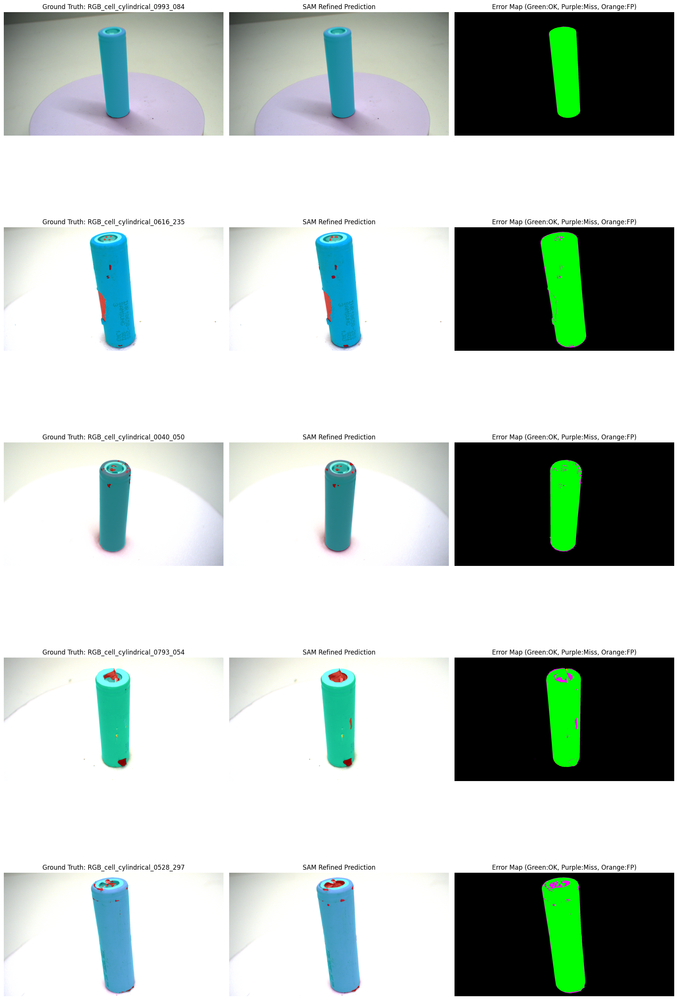

In [46]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# ================= 1. 경로 설정 =================
REFINED_MASK_DIR = '/content/drive/MyDrive/battery_project/refined_masks_boxpoint_final'
VAL_IMG_DIR = '/content/yolo_dataset/val/images'
VAL_LBL_DIR = '/content/yolo_dataset/val/labels'

# 클래스 색상 (0: Battery-하늘색, 1: Damaged-노란색, 2: Pollution-빨간색)
CLASS_COLORS = {0: [0, 255, 255], 1: [255, 255, 0], 2: [255, 0, 0]}

def visualize_analysis(num_samples=5):
    mask_files = [f for f in os.listdir(REFINED_MASK_DIR) if f.endswith('.png')]
    # 분석을 위해 랜덤하게 샘플 선택
    samples = np.random.choice(mask_files, num_samples, replace=False)

    fig, axes = plt.subplots(num_samples, 3, figsize=(18, 6 * num_samples))

    for i, f_name in enumerate(samples):
        base_name = f_name.rsplit('.', 1)[0]
        img_path = os.path.join(VAL_IMG_DIR, f_name.replace('.png', '.jpg')) # 확장자 확인 필요
        if not os.path.exists(img_path):
            img_path = os.path.join(VAL_IMG_DIR, f_name.replace('.png', '.png'))

        # 1. 원본 이미지 및 마스크 로드
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]

        pred_mask = cv2.imread(os.path.join(REFINED_MASK_DIR, f_name), cv2.IMREAD_GRAYSCALE)

        # 2. GT 마스크 생성
        gt_mask = np.full((h, w), 3, dtype=np.uint8)
        lbl_path = os.path.join(VAL_LBL_DIR, base_name + '.txt')
        if os.path.exists(lbl_path):
            with open(lbl_path, 'r') as f:
                for line in f:
                    p = list(map(float, line.strip().split()))
                    cls_id = int(p[0]) - 1
                    if 0 <= cls_id <= 2:
                        poly = (np.array(p[1:]).reshape(-1, 2) * [w, h]).astype(np.int32)
                        cv2.fillPoly(gt_mask, [poly], cls_id)

        # 시각화용 오버레이 생성
        gt_overlay = img.copy()
        pred_overlay = img.copy()
        for cls_id, color in CLASS_COLORS.items():
            gt_overlay[gt_mask == cls_id] = gt_overlay[gt_mask == cls_id] * 0.5 + np.array(color) * 0.5
            pred_overlay[pred_mask == cls_id] = pred_overlay[pred_mask == cls_id] * 0.5 + np.array(color) * 0.5

        # 3. 에러 맵 (Error Map) - 어디가 틀렸나?
        # 초록색: 잘 맞춘 곳, 보라색: 모델이 놓친 곳(미탐), 오렌지색: 모델이 잘못 찾은 곳(과검)
        error_map = np.zeros_like(img)
        error_map[(gt_mask < 3) & (pred_mask == gt_mask)] = [0, 255, 0]   # Correct (TP)
        error_map[(gt_mask < 3) & (pred_mask != gt_mask)] = [255, 0, 255] # Missed (FN)
        error_map[(gt_mask == 3) & (pred_mask < 3)] = [255, 165, 0]      # False Alarm (FP)

        # 결과 그리기
        axes[i, 0].imshow(gt_overlay)
        axes[i, 0].set_title(f"Ground Truth: {base_name}")
        axes[i, 1].imshow(pred_overlay)
        axes[i, 1].set_title("SAM Refined Prediction")
        axes[i, 2].imshow(error_map)
        axes[i, 2].set_title("Error Map (Green:OK, Purple:Miss, Orange:FP)")

        for ax in axes[i]: ax.axis('off')

    plt.tight_layout()
    plt.show()

# 실행
visualize_analysis(num_samples=5)

🚀 모델 로딩 중...


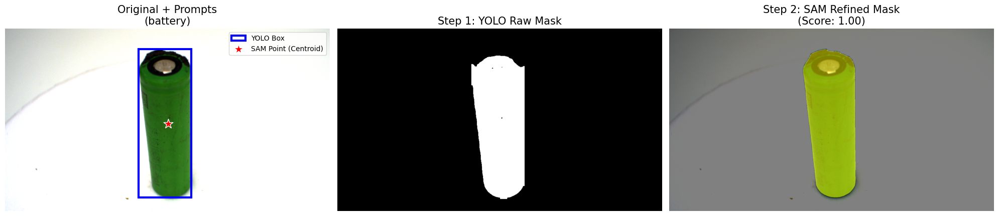

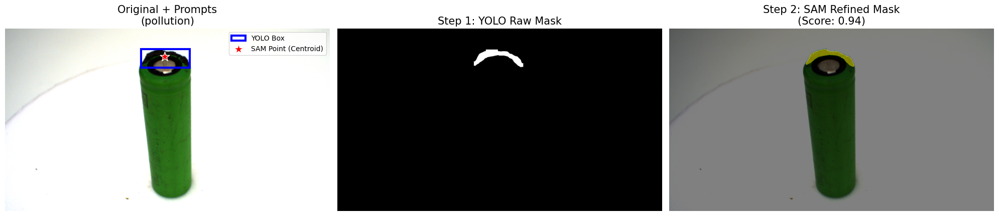

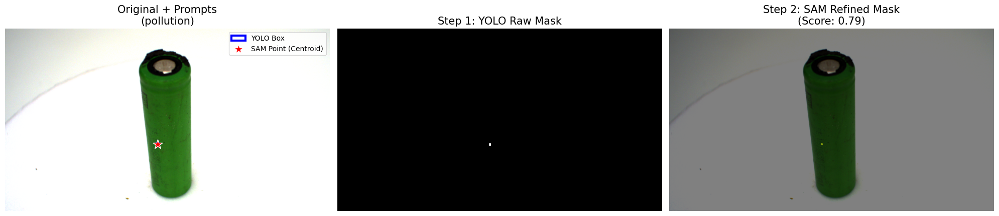

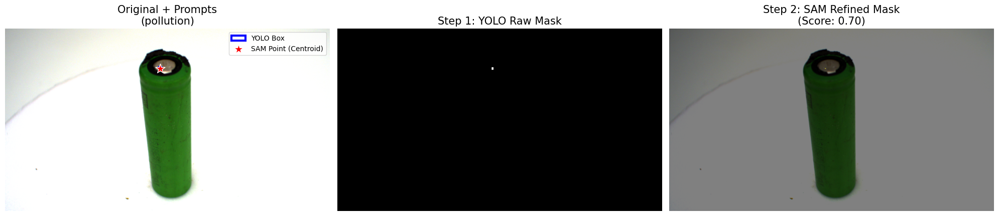

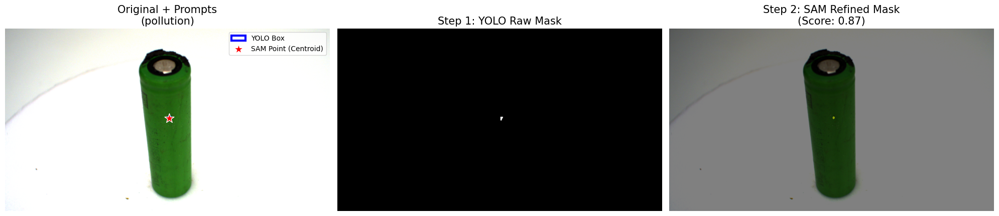

...

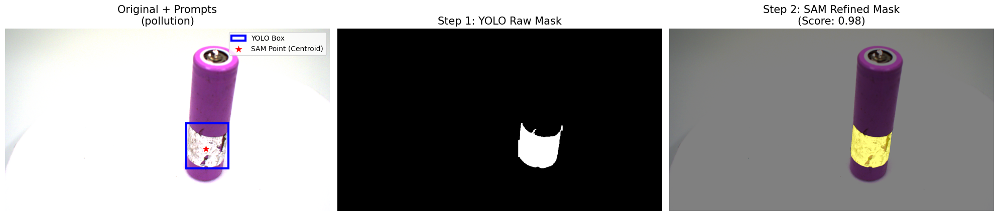

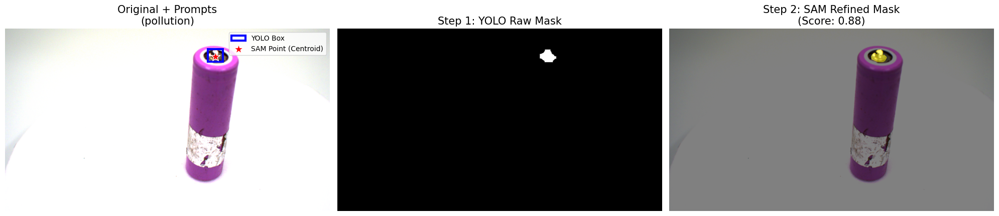

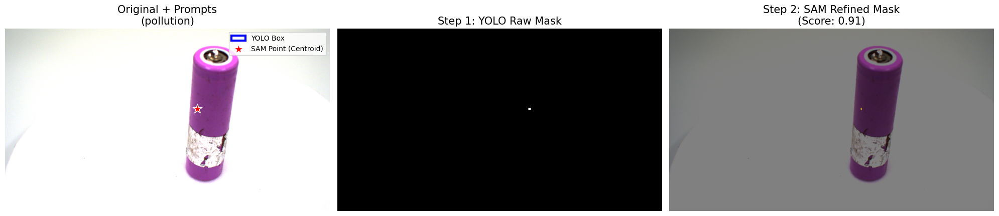

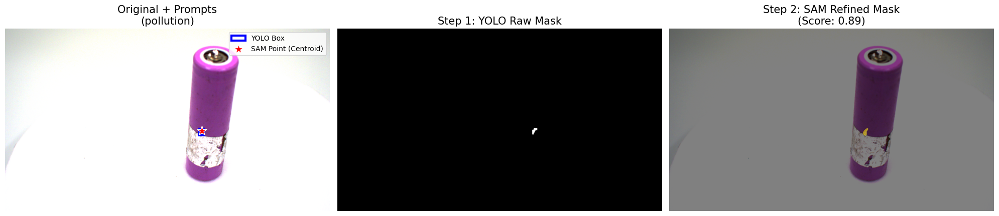

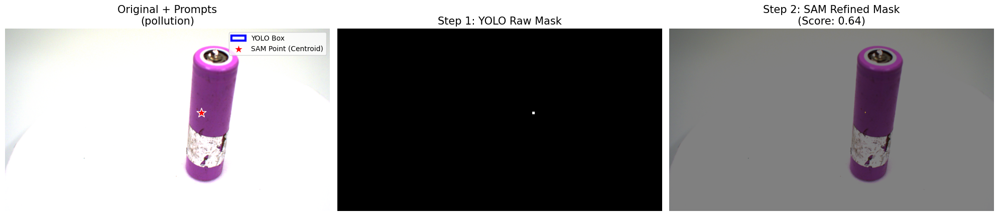

In [49]:
import os
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from segment_anything import sam_model_registry, SamPredictor

# ================= 1. 경로 및 모델 설정 =================
YOLO_MODEL_PATH = '/content/drive/MyDrive/battery_project/weights/best_sgd.pt'
SAM_CHECKPOINT = "/content/sam_vit_h_4b8939.pth"
VAL_IMG_DIR = '/content/yolo_dataset/val/images'
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# 모델 로드
print("🚀 모델 로딩 중...")
yolo_model = YOLO(YOLO_MODEL_PATH)
sam = sam_model_registry["vit_h"](checkpoint=SAM_CHECKPOINT)
sam.to(device=DEVICE)
predictor = SamPredictor(sam)

def get_centroid(mask):
    """마스크에서 중심점 추출"""
    M = cv2.moments(mask.astype(np.uint8))
    if M["m00"] == 0: return None
    return np.array([[int(M["m10"] / M["m00"]), int(M["m01"] / M["m00"])]])

def visualize_refinement_prompts(num_samples=3):
    # 이미지 파일 가져오기
    import glob
    img_files = glob.glob(os.path.join(VAL_IMG_DIR, '*.jpg')) + glob.glob(os.path.join(VAL_IMG_DIR, '*.png'))
    samples = np.random.choice(img_files, num_samples, replace=False)

    for img_path in samples:
        image_bgr = cv2.imread(img_path)
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        h, w = image_rgb.shape[:2]

        # 1. YOLO 추론
        results = yolo_model.predict(img_path, conf=0.15, imgsz=1024, verbose=False)[0]

        if results.masks is None:
            print(f"⏩ {os.path.basename(img_path)}: 탐지된 결함 없음")
            continue

        predictor.set_image(image_rgb)

        # 각 탐지된 결함에 대해 시각화
        for i, (m_data, b_data) in enumerate(zip(results.masks.data, results.boxes)):
            cls_id = int(b_data.cls[0])
            cls_name = yolo_model.names[cls_id]
            box = b_data.xyxy[0].cpu().numpy() # [x1, y1, x2, y2]

            # YOLO 마스크 및 포인트 추출
            yolo_mask = cv2.resize(m_data.cpu().numpy(), (w, h), interpolation=cv2.INTER_NEAREST)
            input_point = get_centroid(yolo_mask)

            if input_point is None: continue

            # 2. SAM 정제 (Box + Point 사용)
            masks, scores, _ = predictor.predict(
                point_coords=input_point,
                point_labels=np.array([1]),
                box=box,
                multimask_output=False
            )
            refined_mask = masks[0]

            # --- 시각화 ---
            fig, ax = plt.subplots(1, 3, figsize=(20, 7))

            # [Panel 1] 원본 이미지 + YOLO Box + SAM Point
            ax[0].imshow(image_rgb)
            # YOLO 박스 그리기 (파란색)
            rect = plt.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1],
                                 fill=False, edgecolor='blue', linewidth=3, label='YOLO Box')
            ax[0].add_patch(rect)
            # SAM 포인트 찍기 (빨간색 별)
            ax[0].scatter(input_point[:, 0], input_point[:, 1], color='red', marker='*', s=200,
                          edgecolor='white', label='SAM Point (Centroid)')
            ax[0].set_title(f"Original + Prompts\n({cls_name})", fontsize=15)
            ax[0].legend()

            # [Panel 2] YOLO가 처음에 찾은 마스크 (정제 전)
            ax[1].imshow(yolo_mask, cmap='gray')
            ax[1].set_title("Step 1: YOLO Raw Mask", fontsize=15)

            # [Panel 3] SAM이 정제한 최종 마스크 (정제 후)
            # 결과물 확인을 위해 원본 위에 오버레이
            ax[2].imshow(image_rgb)
            overlay = np.zeros_like(image_rgb)
            overlay[refined_mask] = [255, 255, 0] # 노란색으로 표시
            ax[2].imshow(overlay, alpha=0.5)
            ax[2].set_title(f"Step 2: SAM Refined Mask\n(Score: {scores[0]:.2f})", fontsize=15)

            for a in ax: a.axis('off')
            plt.tight_layout()
            plt.show()

# 실행
visualize_refinement_prompts(num_samples=2)